In [6]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import mplhep as hep
from matplotlib.patches import Rectangle
from pathlib import Path
from typing import List, Union

from scipy.linalg import solve_triangular, qr
import json
import re
import os
import uproot
import importlib.util
plt.style.use(hep.style.CMS)

In [7]:
label_map = {
    "pth_bin0": "r_PTH_0p0_5p0",
    "pth_bin1": "r_PTH_5p0_10p0",
    "pth_bin2": "r_PTH_10p0_15p0",
    "pth_bin3": "r_PTH_15p0_20p0",
    "pth_bin4": "r_PTH_20p0_25p0",
    "pth_bin5": "r_PTH_25p0_30p0",
    "pth_bin6": "r_PTH_30p0_35p0",
    "pth_bin7": "r_PTH_35p0_45p0",
    "pth_bin8": "r_PTH_45p0_60p0",
    "pth_bin9": "r_PTH_60p0_80p0",
    "pth_bin10": "r_PTH_80p0_100p0",
    "pth_bin11": "r_PTH_100p0_120p0",
    "pth_bin12": "r_PTH_120p0_140p0",
    "pth_bin13": "r_PTH_140p0_170p0",
    "pth_bin14": "r_PTH_170p0_200p0",
    "pth_bin15": "r_PTH_200p0_250p0",
    "pth_bin16": "r_PTH_250p0_350p0",
    "pth_bin17": "r_PTH_350p0_450p0",
    "pth_bin18": "r_PTH_450p0_10000p0",
    "nj_bin0": "r_NJ_0p0_1p0",
    "nj_bin1": "r_NJ_1p0_2p0",
    "nj_bin2": "r_NJ_2p0_3p0",
    "nj_bin3": "r_NJ_3p0_4p0",
    "nj_bin4": "r_NJ_4p0_100p0",
    "ptj0_bin0": "r_PTJ0_m10000p0_30p0",
    "ptj0_bin1": "r_PTJ0_30p0_40p0",
    "ptj0_bin2": "r_PTJ0_40p0_55p0",
    "ptj0_bin3": "r_PTJ0_55p0_75p0",
    "ptj0_bin4": "r_PTJ0_75p0_95p0",
    "ptj0_bin5": "r_PTJ0_95p0_120p0",
    "ptj0_bin6": "r_PTJ0_120p0_150p0",
    "ptj0_bin7": "r_PTJ0_150p0_200p0",
    "ptj0_bin8": "r_PTJ0_200p0_10000p0",
    # "rapidity_bin0": "r_YH_0p0_0p15",
    # "rapidity_bin1": "r_YH_0p15_0p3",
    # "rapidity_bin2": "r_YH_0p3_0p45",
    # "rapidity_bin3": "r_YH_0p45_0p6",
    # "rapidity_bin4": "r_YH_0p6_0p75",
    # "rapidity_bin5": "r_YH_0p75_0p9",
    # "rapidity_bin6": "r_YH_0p9_1p2",
    # "rapidity_bin7": "r_YH_1p2_1p6",
    # "rapidity_bin8": "r_YH_1p6_2p0",
    # "rapidity_bin9": "r_YH_2p0_2p5",
    "dphij0j1_bin0": "r_DPhiJ0J1_m3p1416_3p1416_underflow",
    "dphij0j1_bin1": "r_DPhiJ0J1_m3p1416_m1p5708",
    "dphij0j1_bin2": "r_DPhiJ0J1_m1p5708_0p0",
    "dphij0j1_bin3": "r_DPhiJ0J1_0p0_1p5708",
    "dphij0j1_bin4": "r_DPhiJ0J1_1p5708_3p1416",
    "massj0j1_bin0": "r_MassJ0J1_m10000p0_0p0",
    "massj0j1_bin1": "r_MassJ0J1_0p0_90p0",
    "massj0j1_bin2": "r_MassJ0J1_90p0_160p0",
    "massj0j1_bin3": "r_MassJ0J1_160p0_300p0",
    "massj0j1_bin4": "r_MassJ0J1_300p0_500p0",
    "massj0j1_bin5": "r_MassJ0J1_500p0_1000p0",
    "massj0j1_bin6": "r_MassJ0J1_1000p0_10000p0",
    "costhetastarcs_bin0": "r_CosThetaStarCS_0p0_0p07",
    "costhetastarcs_bin1": "r_CosThetaStarCS_0p07_0p15",
    "costhetastarcs_bin2": "r_CosThetaStarCS_0p15_0p22",
    "costhetastarcs_bin3": "r_CosThetaStarCS_0p22_0p35",
    "costhetastarcs_bin4": "r_CosThetaStarCS_0p35_0p45",
    "costhetastarcs_bin5": "r_CosThetaStarCS_0p45_0p55",
    "costhetastarcs_bin6": "r_CosThetaStarCS_0p55_0p75",
    "costhetastarcs_bin7": "r_CosThetaStarCS_0p75_1p0"
}


label_map_theory = {
    "PTH_bin0": "r_PTH_0p0_5p0",
    "PTH_bin1": "r_PTH_5p0_10p0",
    "PTH_bin2": "r_PTH_10p0_15p0",
    "PTH_bin3": "r_PTH_15p0_20p0",
    "PTH_bin4": "r_PTH_20p0_25p0",
    "PTH_bin5": "r_PTH_25p0_30p0",
    "PTH_bin6": "r_PTH_30p0_35p0",
    "PTH_bin7": "r_PTH_35p0_45p0",
    "PTH_bin8": "r_PTH_45p0_60p0",
    "PTH_bin9": "r_PTH_60p0_80p0",
    "PTH_bin10": "r_PTH_80p0_100p0",
    "PTH_bin11": "r_PTH_100p0_120p0",
    "PTH_bin12": "r_PTH_120p0_140p0",
    "PTH_bin13": "r_PTH_140p0_170p0",
    "PTH_bin14": "r_PTH_170p0_200p0",
    "PTH_bin15": "r_PTH_200p0_250p0",
    "PTH_bin16": "r_PTH_250p0_350p0",
    "PTH_bin17": "r_PTH_350p0_450p0",
    "PTH_bin18": "r_PTH_450p0_10000p0",
    "NJ_bin0": "r_NJ_0p0_1p0",
    "NJ_bin1": "r_NJ_1p0_2p0",
    "NJ_bin2": "r_NJ_2p0_3p0",
    "NJ_bin3": "r_NJ_3p0_4p0",
    "NJ_bin4": "r_NJ_4p0_100p0",
    "PTJ0_bin0": "r_PTJ0_m10000p0_30p0",
    "PTJ0_bin1": "r_PTJ0_30p0_40p0",
    "PTJ0_bin2": "r_PTJ0_40p0_55p0",
    "PTJ0_bin3": "r_PTJ0_55p0_75p0",
    "PTJ0_bin4": "r_PTJ0_75p0_95p0",
    "PTJ0_bin5": "r_PTJ0_95p0_120p0",
    "PTJ0_bin6": "r_PTJ0_120p0_150p0",
    "PTJ0_bin7": "r_PTJ0_150p0_200p0",
    "PTJ0_bin8": "r_PTJ0_200p0_10000p0",
    "YH_bin0": "r_YH_0p0_0p15",
    "YH_bin1": "r_YH_0p15_0p3",
    "YH_bin2": "r_YH_0p3_0p45",
    "YH_bin3": "r_YH_0p45_0p6",
    "YH_bin4": "r_YH_0p6_0p75",
    "YH_bin5": "r_YH_0p75_0p9",
    "YH_bin6": "r_YH_0p9_1p2",
    "YH_bin7": "r_YH_1p2_1p6",
    "YH_bin8": "r_YH_1p6_2p0",
    "YH_bin9": "r_YH_2p0_2p5",
    "DPhiJ0J1_bin0": "r_DPhiJ0J1_m3p1416_3p1416_underflow",
    "DPhiJ0J1_bin1": "r_DPhiJ0J1_m3p1416_m1p5708",
    "DPhiJ0J1_bin2": "r_DPhiJ0J1_m1p5708_0p0",
    "DPhiJ0J1_bin3": "r_DPhiJ0J1_0p0_1p5708",
    "DPhiJ0J1_bin4": "r_DPhiJ0J1_1p5708_3p1416",
    "MassJ0J1_bin0": "r_MassJ0J1_m10000p0_0p0",
    "MassJ0J1_bin1": "r_MassJ0J1_0p0_90p0",
    "MassJ0J1_bin2": "r_MassJ0J1_90p0_160p0",
    "MassJ0J1_bin3": "r_MassJ0J1_160p0_300p0",
    "MassJ0J1_bin4": "r_MassJ0J1_300p0_500p0",
    "MassJ0J1_bin5": "r_MassJ0J1_500p0_1000p0",
    "MassJ0J1_bin6": "r_MassJ0J1_1000p0_10000p0",
    "CosThetaStarCS_bin0": "r_CosThetaStarCS_0p0_0p07",
    "CosThetaStarCS_bin1": "r_CosThetaStarCS_0p07_0p15",
    "CosThetaStarCS_bin2": "r_CosThetaStarCS_0p15_0p22",
    "CosThetaStarCS_bin3": "r_CosThetaStarCS_0p22_0p35",
    "CosThetaStarCS_bin4": "r_CosThetaStarCS_0p35_0p45",
    "CosThetaStarCS_bin5": "r_CosThetaStarCS_0p45_0p55",
    "CosThetaStarCS_bin6": "r_CosThetaStarCS_0p55_0p75",
    "CosThetaStarCS_bin7": "r_CosThetaStarCS_0p75_1p0"
}

# Importing translation dictionary
translationFilePath = "/work/niharrin/devel/useful_scripts/EFT_scripts/parametrization/translation.json"
with open(translationFilePath) as translationFile:
    translation = json.load(translationFile)

In [8]:
def read_bootstrap_file(path: Union[str, Path], prefix: str) -> pd.DataFrame:
    """
    Read one bootstrap text file.
    - Drops the first 4 header lines.
    - Drops first data column (replica index).
    - Returns only bin columns, prefixed to keep names unique across files.
    """
    path = Path(path)

    # Header in these files starts with '#'; this also skips the first 4 lines
    df = pd.read_csv(path, sep=r"\s+", comment="#", header=None)

    # Drop first row (text labels) and first column (replica/bin label)
    df = df.iloc[:, 1:].copy()
    df.columns = [f"{prefix}_bin{i}" for i in range(df.shape[1])]

    return df


def build_df(
    pth_path: Union[str, Path],
    nj_path: Union[str, Path],
    # rapidity_path: Union[str, Path],
    costhetastarcs_path: Union[str, Path],
    massj0j1_path: Union[str, Path],
    ptj0_path: Union[str, Path],
    dphij0j1_path: Union[str, Path],
) -> pd.DataFrame:
    """Read all three files and return one dataframe per variable"""
    pth = read_bootstrap_file(pth_path, "pth")
    nj = read_bootstrap_file(nj_path, "nj")
    # rapidity = read_bootstrap_file(rapidity_path, "rapidity")
    costhetastarcs = read_bootstrap_file(costhetastarcs_path, "costhetastarcs")
    massj0j1 = read_bootstrap_file(massj0j1_path, "massj0j1")
    ptj0 = read_bootstrap_file(ptj0_path, "ptj0")
    dphij0j1 = read_bootstrap_file(dphij0j1_path, "dphij0j1")

    # Check if all variables have the same number of replicas
    if not (len(pth) == len(nj) == len(ptj0) == len(massj0j1) == len(dphij0j1)):
    # if not (len(pth) == len(nj) == len(ptj0) == len(dphij0j1)):
    # if not (len(pth) == len(nj)):
        raise ValueError("Replica counts do not match across files.")

    return pd.concat([pth, nj, costhetastarcs, massj0j1, ptj0, dphij0j1], axis=1)
    # return pd.concat([pth, nj, massj0j1, ptj0, dphij0j1], axis=1)
    # return pd.concat([pth, nj, ptj0, dphij0j1], axis=1)

## Helper function to invert a matrix and compute correlations from covariances
def invert_matrix(matrix: pd.DataFrame) -> pd.DataFrame:
    return pd.DataFrame(
        np.linalg.pinv(matrix.to_numpy()),
        index=matrix.index,
        columns=matrix.columns,
    )

## Helper function to compute correlations from covariances
def compute_corr(cov: pd.DataFrame) -> pd.DataFrame:
    sigma = np.sqrt(np.diag(cov.to_numpy()))
    denom = np.outer(sigma, sigma)
    corr = np.divide(
        cov.to_numpy(),
        denom,
        out=np.zeros_like(cov.to_numpy()), 
        where=denom != 0,
    )
    return pd.DataFrame(corr, index=cov.index, columns=cov.columns)

# Plot correlation matrix at gen-level
def plot_corr(_corr_gen, title="Correlation Matrix (Generator Level)", save_path=None, label_map=None, cms_label="Supplementary", plot_label="Correlation", apply_translation=True, n_b1=None, n_b2=None, n_b3=None, n_b4=None):
    corr_gen_mask = np.triu(np.ones_like(_corr_gen, dtype=bool), k=1)
    fig_corr_gen, ax_corr_gen = plt.subplots(figsize=(28, 18), constrained_layout=True)
    hep.set_style("CMS")
    hep.cms.label(cms_label, loc=0, data=True, lumi=172.13, com=13.6)
    sns.heatmap(
        _corr_gen,
        ax=ax_corr_gen,
        cmap=palette,
        mask=corr_gen_mask,
        vmin=-1,
        vmax=1,
        annot=True,
        fmt=".2f",
        center=0,
        square=True,
        annot_kws={"size": 10, "weight": "bold"},
        cbar_kws={"label": plot_label},
    )
    ax_corr_gen.set_title(title)
    ax_corr_gen.set_xlabel("Bins")
    ax_corr_gen.set_ylabel("Bins")
    
    # ---- LABEL TRANSLATION LOGIC ----
    if label_map is not None:
        # assume index == columns order
        original_labels = list(_corr_gen.index)

        translated_labels = [
            label_map.get(lbl, lbl) for lbl in original_labels
        ]

        if apply_translation:
            translated_labels = [translation[current_label] for current_label in translated_labels]
        
        n = len(translated_labels)
        ax_corr_gen.set_xticks(np.arange(n) + 0.5)
        ax_corr_gen.set_yticks(np.arange(n) + 0.5)
        
        ax_corr_gen.set_xticklabels(translated_labels, rotation=90, fontsize=12)
        ax_corr_gen.set_yticklabels(translated_labels, rotation=0, fontsize=12)
        # IMPORTANT: re-apply tick styling AFTER setting labels
        ax_corr_gen.tick_params(
            axis="x",
            which="both",
            length=0,   # <- removes tick marks
            bottom=False,
            top=False
        )
        ax_corr_gen.tick_params(
            axis="y",
            which="both",
            length=0,   # <- removes tick marks
            left=False,
            right=False
        )

    else:
        ax_corr_gen.tick_params(
            axis="x", which="both", labelrotation=90, bottom=False, top=False, length=0, labelsize=12
        )
        ax_corr_gen.tick_params(
            axis="y", which="both", labelrotation=0, left=False, right=False, length=0, labelsize=12
        )

    ax_corr_gen.minorticks_off()
    n_bins = _corr_gen.shape[0]
    if n_b1 == None:
        n_b1 = b1
    if n_b2 == None:
        n_b2 = b2
    if n_b3 == None:
        n_b3 = b3
    if n_b4 == None:
        n_b4 = b4
    for b in (n_b1, n_b2, n_b3, n_b4):
        # Draw only on the visible lower triangle
        ax_corr_gen.plot([0, b], [b, b], color="black", lw=1)
        ax_corr_gen.plot([b, b], [b, n_bins], color="black", lw=1)
    ax_corr_gen.add_patch(Rectangle((0, 0), n_bins, n_bins, fill=False, edgecolor="black", lw=2))
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    else:
        plt.show()

# Plot covariance matrix at gen-level
def plot_cov(_corr_gen, title="Covariance Matrix (Generator Level)", save_path=None, label_map=None, cms_label="Supplementary", plot_label=r"Covariance [fb$^{2}$]", apply_translation=True, n_b1=None, n_b2=None, n_b3=None, n_b4=None):
    corr_gen_mask = np.triu(np.ones_like(_corr_gen, dtype=bool), k=1)
    fig_corr_gen, ax_corr_gen = plt.subplots(figsize=(28, 18), constrained_layout=True)
    hep.set_style("CMS")
    hep.cms.label(cms_label, loc=0, data=True, lumi=172.13, com=13.6)
    sns.heatmap(
        _corr_gen,
        ax=ax_corr_gen,
        cmap=palette,
        mask=corr_gen_mask,
        vmin = _corr_gen.to_numpy().min(),
        vmax = _corr_gen.to_numpy().max(),
        annot=True,
        fmt=".2f",
        center=0,
        square=True,
        annot_kws={"size": 10, "weight": "bold"},
        cbar_kws={"label": plot_label},
        # cbar_kws={"label": "Theoretical Covariance"},
    )
    ax_corr_gen.set_title(title)
    ax_corr_gen.set_xlabel("Bins")
    ax_corr_gen.set_ylabel("Bins")
    
    # ---- LABEL TRANSLATION LOGIC ----
    if label_map is not None:
        # assume index == columns order
        original_labels = list(_corr_gen.index)

        translated_labels = [
            label_map.get(lbl, lbl) for lbl in original_labels
        ]
        
        if apply_translation:
            translated_labels = [translation[current_label] for current_label in translated_labels]

        n = len(translated_labels)
        ax_corr_gen.set_xticks(np.arange(n) + 0.5)
        ax_corr_gen.set_yticks(np.arange(n) + 0.5)

        ax_corr_gen.set_xticklabels(translated_labels, rotation=90, fontsize=12)
        ax_corr_gen.set_yticklabels(translated_labels, rotation=0, fontsize=12)
        # IMPORTANT: re-apply tick styling AFTER setting labels
        ax_corr_gen.tick_params(
            axis="x",
            which="both",
            length=0,   # <- removes tick marks
            bottom=False,
            top=False
        )
        ax_corr_gen.tick_params(
            axis="y",
            which="both",
            length=0,   # <- removes tick marks
            left=False,
            right=False
        )

    else:
        ax_corr_gen.tick_params(
            axis="x", which="both", labelrotation=90, bottom=False, top=False, length=0, labelsize=12
        )
        ax_corr_gen.tick_params(
            axis="y", which="both", labelrotation=0, left=False, right=False, length=0, labelsize=12
        )

    ax_corr_gen.minorticks_off()
    n_bins = _corr_gen.shape[0]
    if n_b1 == None:
        n_b1 = b1
    if n_b2 == None:
        n_b2 = b2
    if n_b3 == None:
        n_b3 = b3
    if n_b4 == None:
        n_b4 = b4
    for b in (n_b1, n_b2, n_b3, n_b4):
        # Draw only on the visible lower triangle
        ax_corr_gen.plot([0, b], [b, b], color="black", lw=1)
        ax_corr_gen.plot([b, b], [b, n_bins], color="black", lw=1)
    ax_corr_gen.add_patch(Rectangle((0, 0), n_bins, n_bins, fill=False, edgecolor="black", lw=2))
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    else:
        plt.show()

In [9]:
# VARIABLE_PREFIXES = ("pth_", "nj_", "rapidity_", "ptj0_", "DPhiJ0J1_")
# VARIABLE_PREFIXES = ("pth_", "nj_", "costhetastarcs_", "massj0j1_", "ptj0_", "DPhiJ0J1_")
VARIABLE_PREFIXES = ("pth_", "nj_", "massj0j1_", "ptj0_", "DPhiJ0J1_")

CAT = ["cat0", "cat1", "cat2"]

YEARS = ["2022", "2023", "2024"]
# YEARS = ["2022", "2023"]


def zero_intra_variable_off_diagonal_block(matrix: pd.DataFrame) -> pd.DataFrame:
    out = matrix.copy()
    cols = list(out.columns)
    for pref in VARIABLE_PREFIXES:
        group = [c for c in cols if c.startswith(pref)]
        for ci in group:
            for cj in group:
                if ci != cj:
                    out.loc[ci, cj] = 0.0
    return out

def zero_below_threshold_keep_diag(matrix: pd.DataFrame, threshold: float, use_abs: bool = True) -> pd.DataFrame:
    out = matrix.copy()
    vals = out.abs() if use_abs else out
    mask = vals < threshold
    np.fill_diagonal(mask.values, False)
    out[mask] = 0.0
    return out

def corr_from_cov(cov_mat: pd.DataFrame) -> pd.DataFrame:
    v = np.diag(cov_mat.to_numpy())
    sigma = np.sqrt(np.clip(v, 0.0, None))
    with np.errstate(divide="ignore", invalid="ignore"):
        outer = np.outer(1.0 / sigma, 1.0 / sigma)
        arr = outer * cov_mat.to_numpy()
    arr = np.nan_to_num(arr, nan=0.0, posinf=0.0, neginf=0.0)
    np.fill_diagonal(arr, 1.0)
    return pd.DataFrame(arr, index=cov_mat.index, columns=cov_mat.columns)

####################################################################################################

cov = {}
corr = {}
df_dict = {}

for cat in CAT:
    
    # We can combine the sidebands across the YEARS (also done in FinalFits)
    df_combined = pd.DataFrame()
    
    for year in YEARS:
        df = build_df(
            f"bootstrap/bootstrap_sideband_counts_pth_{cat}_{year}.txt",
            f"bootstrap/bootstrap_sideband_counts_nj_{cat}_{year}.txt",
            # f"bootstrap/bootstrap_sideband_counts_rapidity_{cat}_{year}.txt",
            f"bootstrap/bootstrap_sideband_counts_CosThetaStarCS_{cat}_{year}.txt",
            f"bootstrap/bootstrap_sideband_counts_MassJ0J1_{cat}_{year}.txt",
            f"bootstrap/bootstrap_sideband_counts_ptj0_{cat}_{year}.txt",
            f"bootstrap/bootstrap_sideband_counts_DPhiJ0J1_{cat}_{year}.txt",
        )
                
        df_combined = df_combined.add(df, fill_value=0)
    
    # if cat == "cat0":
    #     print(df_combined)
    
    df_combined = df_combined.reindex(columns=df.columns)    
    
    c = df_combined.cov()
    
    ## To force setting all off-diagonal entries within each observable to zero uncomment below
    ## This can be useful when running on few replicas where fluctuations can induce non-zero off-diagonal entries
    c = zero_intra_variable_off_diagonal_block(c)
    ## This can be used to set all elements below a threshold to zero
    # c = zero_below_threshold_keep_diag(c, 200)
    ## Force the symmetry of the covariance matrix
    c = 0.5 * (c + c.T)
    
    # label_to_drop = c.index[12]
    # c = c.drop(index=label_to_drop, columns=label_to_drop)
    cov[cat] = c
    corr[cat] = df_combined.corr()#.drop(index=label_to_drop, columns=label_to_drop)

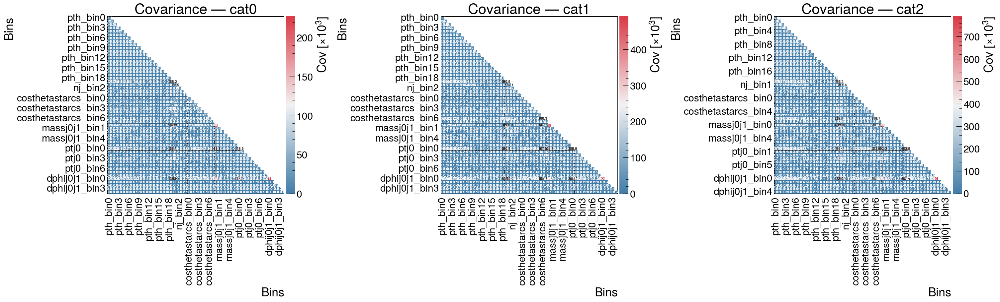

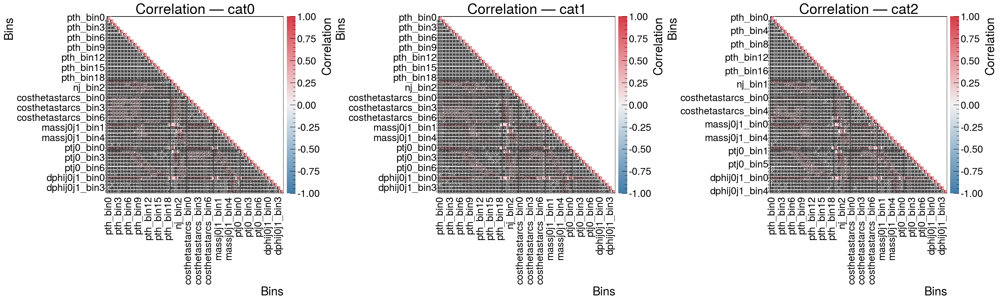

In [6]:
hep.style.use("CMS")
palette = sns.diverging_palette(240, 10, n=20, as_cmap=True)


# Boundaries between variable blocks (pth | nj | ptj0); same layout for all categories
_ref = cov[CAT[-1]]  # same bin layout for all categories

b1 = len([c for c in _ref.columns if c.startswith("pth_")])
b2 = b1 + len([c for c in _ref.columns if c.startswith("nj_")])
b3 = b2 + len([c for c in _ref.columns if c.startswith("massj0j1_")]) + 1
# b4 = b3 + len([c for c in _ref.columns if c.startswith("rapidity_")]) - 1
b4 = b3 + len([c for c in _ref.columns if c.startswith("ptj0_")]) - 1

def _decorate_matrix_ax(ax, n_bins: int) -> None:
    ax.tick_params(axis="x", which="both", labelrotation=90, bottom=False, top=False, length=0)
    ax.tick_params(axis="y", which="both", labelrotation=0, left=False, right=False, length=0)
    ax.minorticks_off()
    for b in (b1, b2, b3, b4):
        ax.plot([0, b], [b, b], color="black", lw=1)
        ax.plot([b, b], [b, n_bins], color="black", lw=1)
    ax.add_patch(Rectangle((0, 0), n_bins, n_bins, fill=False, edgecolor="black", lw=2))


# 1) Covariance matrices (one panel per category)
cov_scale = 1e3
nc = len(CAT)
fig_cov, axes_cov = plt.subplots(1, nc, figsize=(10 * nc, 9), constrained_layout=True)
if nc == 1:
    axes_cov = np.array([axes_cov])

for ax, cat in zip(axes_cov.flat, CAT):
    cov_plot = cov[cat] / cov_scale
    cov_mask = np.triu(np.ones_like(cov_plot, dtype=bool), k=1)
    sns.heatmap(
        cov_plot,
        ax=ax,
        cmap=palette,
        mask=cov_mask,
        annot=True,
        fmt=".1f",
        # square=True,
        annot_kws={"size": 8, "weight": "bold"},
        cbar_kws={"label": r"Cov [$\times 10^3$]", 'pad': .005},
    )
    ax.set_title(f"Covariance — {cat}")
    ax.set_xlabel("Bins")
    ax.set_ylabel("Bins")
    _decorate_matrix_ax(ax, cov_plot.shape[0])

plt.savefig(f"cov_matrix_perCategory_combined.pdf", bbox_inches="tight")
plt.show()

# 2) Correlation matrices (one panel per category)
fig_corr, axes_corr = plt.subplots(1, nc, figsize=(10 * nc, 9), constrained_layout=True)
if nc == 1:
    axes_corr = np.array([axes_corr])

for ax, cat in zip(axes_corr.flat, CAT):
    # cmat = corr[cat]
    cmat = corr_from_cov(cov[cat])
    corr_mask = np.triu(np.ones_like(cmat, dtype=bool), k=1)
    sns.heatmap(
        cmat,
        ax=ax,
        cmap=palette,
        mask=corr_mask,
        vmin=-1,
        vmax=1,
        annot=True,
        fmt=".2f",
        center=0,
        square=True,
        annot_kws={"size": 8, "weight": "bold"},
        cbar_kws={"label": "Correlation", 'pad': .005},
    )
    ax.set_title(f"Correlation — {cat}")
    ax.set_xlabel("Bins")
    ax.set_ylabel("Bins")
    _decorate_matrix_ax(ax, cmat.shape[0])

plt.savefig(f"cor_matrix_perCategory_combined.pdf", bbox_inches="tight")
plt.show()

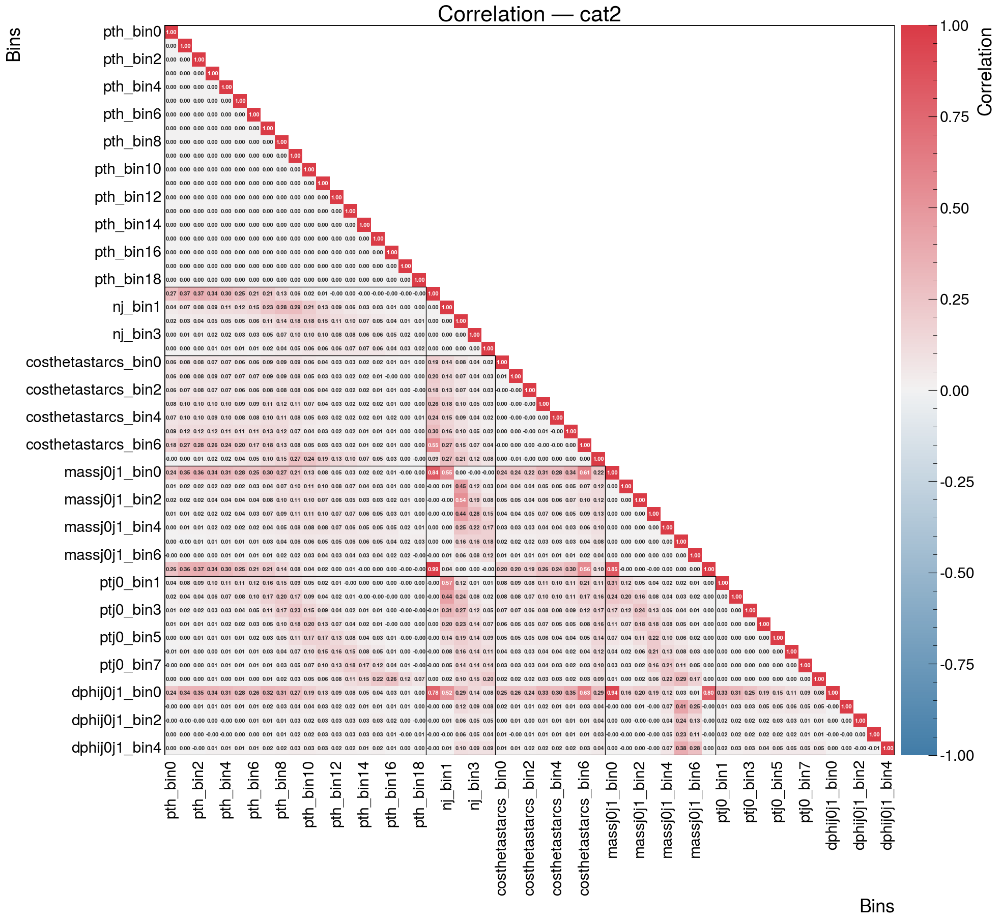

In [9]:
fig_corr, ax = plt.subplots(
    figsize=(24, 18),
    constrained_layout=True
)

cat = "cat2"

cmat = corr_from_cov(cov[cat])
corr_mask = np.triu(np.ones_like(cmat, dtype=bool), k=1)

sns.heatmap(
    cmat,
    ax=ax,
    cmap=palette,
    mask=corr_mask,
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    center=0,
    square=True,
    annot_kws={"size": 8, "weight": "bold"},
    cbar_kws={"label": "Correlation", "pad": 0.005},
)

ax.set_title(f"Correlation — {cat}")
ax.set_xlabel("Bins")
ax.set_ylabel("Bins")

_decorate_matrix_ax(ax, cmat.shape[0])

# plt.show()
plt.savefig(f"correlation_sidebands_{cat}.pdf", dpi=300)

In [10]:
## Loading the response matrix
def read_response_block(path: str):
    """Read response_matrix_*.txt and return numeric square block."""
    raw = pd.read_csv(path, sep=r"\s+", header=None)
    block = raw.iloc[1:, 1:].astype(float).to_numpy()
    # if block.shape[0] != block.shape[1]:
    #     raise ValueError(f"Response block is not square for {path}: {block.shape}")
    return block


def response_paths_for_category(cat: str) -> dict:
    """Lumi-weighted response .txt paths per observable for one reco category."""
    suffix = "combined" #combined
    return {
        "pth": f"response_matrix_{suffix}/response_matrix_PTH_{cat}.txt",
        "nj": f"response_matrix_{suffix}/response_matrix_NJ_{cat}.txt",
        # "rapidity": f"response_matrix_{suffix}/response_matrix_YH_{cat}.txt",
        "costhetastarcs": f"response_matrix_{suffix}/response_matrix_CosThetaStarCS_{cat}.txt",
        "massj0j1": f"response_matrix_{suffix}/response_matrix_MassJ0J1_{cat}.txt",
        "ptj0": f"response_matrix_{suffix}/response_matrix_PTJ0_{cat}.txt",
        "dphij0j1": f"response_matrix_{suffix}/response_matrix_DPhiJ0J1_{cat}.txt",
    }


def build_block_diagonal_resp(cov_mat: pd.DataFrame, cat: str) -> pd.DataFrame:
    resp_files = response_paths_for_category(cat)
    cols = list(cov_mat.columns)
    prefix_order = []
    for col in cols:
        pref = col.split("_", 1)[0]
        if pref not in prefix_order:
            prefix_order.append(pref)
    resp = pd.DataFrame(0.0, index=cov_mat.index, columns=cov_mat.columns)
    start = 0
    for pref in prefix_order:
        block_cols = [c for c in cols if c.startswith(f"{pref}_")]
        n = len(block_cols)
        if pref not in resp_files:
            raise ValueError(f"No response matrix file configured for prefix '{pref}'")

        block = read_response_block(resp_files[pref])
        if block.shape != (n, n):
            raise ValueError(
                f"Shape mismatch for {resp_files[pref]}: got {block.shape}, expected {(n, n)}"
            )

        stop = start + n
        resp.iloc[start:stop, start:stop] = block
        start = stop
    return resp

resp = {cat: build_block_diagonal_resp(cov[cat], cat) for cat in CAT}

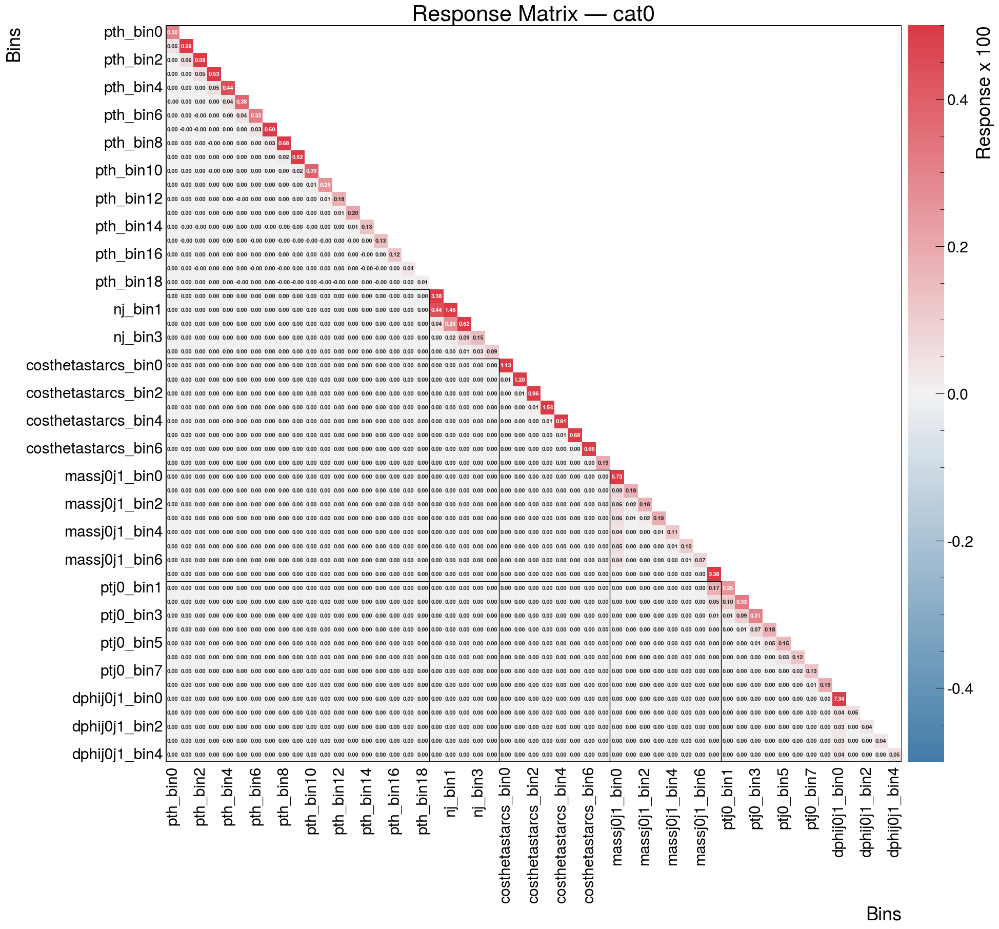

In [11]:
fig_corr, ax = plt.subplots(
    figsize=(24, 18),
    constrained_layout=True
)

cat = "cat0"


cmat = resp[cat]*100
corr_mask = np.triu(np.ones_like(cmat, dtype=bool), k=1)

sns.heatmap(
    cmat,
    ax=ax,
    cmap=palette,
    mask=corr_mask,
    vmin=-0.5,
    vmax=0.5,
    annot=True,
    fmt=".2f",
    center=0,
    square=True,
    annot_kws={"size": 8, "weight": "bold"},
    cbar_kws={"label": "Response x 100", "pad": 0.005},
)

ax.set_title(f"Response Matrix — {cat}")
ax.set_xlabel("Bins")
ax.set_ylabel("Bins")

_decorate_matrix_ax(ax, cmat.shape[0])

# plt.show()
plt.savefig(f"response_{cat}.pdf", dpi=300)

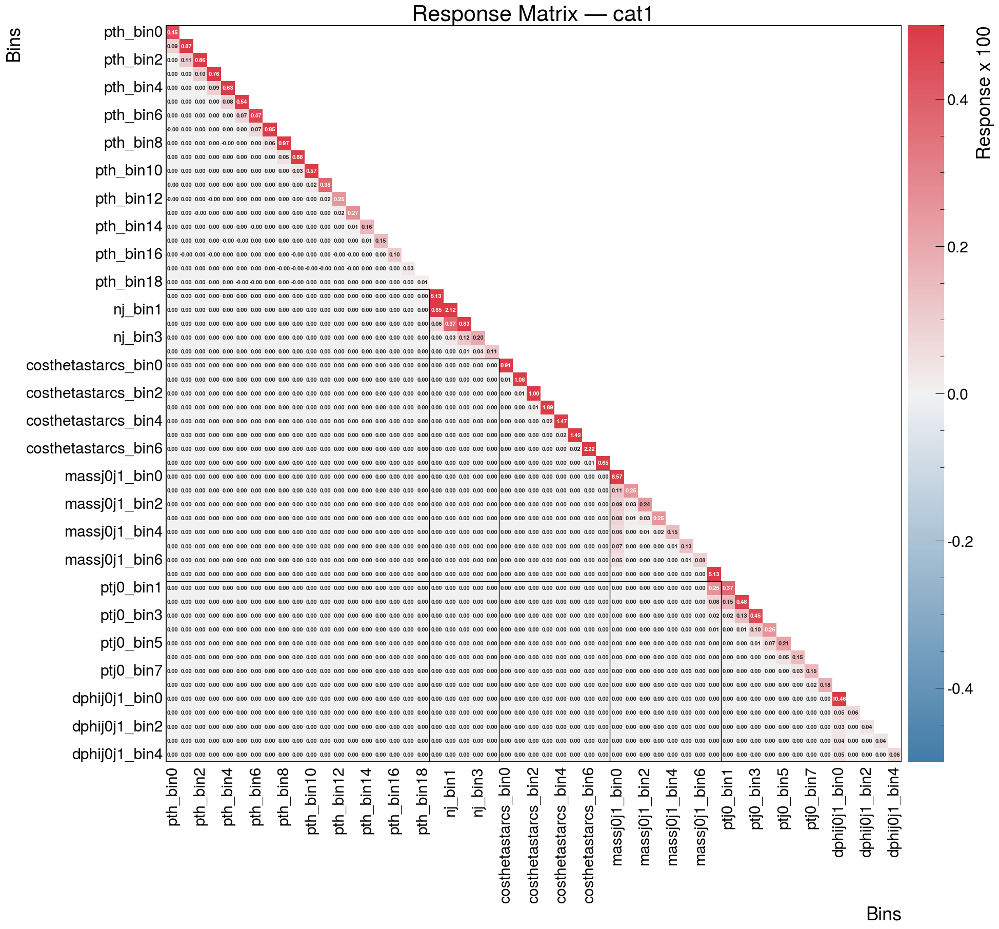

In [12]:
fig_corr, ax = plt.subplots(
    figsize=(24, 18),
    constrained_layout=True
)

cat = "cat1"

cmat = resp[cat]*100
corr_mask = np.triu(np.ones_like(cmat, dtype=bool), k=1)

sns.heatmap(
    cmat,
    ax=ax,
    cmap=palette,
    mask=corr_mask,
    vmin=-0.5,
    vmax=0.5,
    annot=True,
    fmt=".2f",
    center=0,
    square=True,
    annot_kws={"size": 8, "weight": "bold"},
    cbar_kws={"label": "Response x 100", "pad": 0.005},
)

ax.set_title(f"Response Matrix — {cat}")
ax.set_xlabel("Bins")
ax.set_ylabel("Bins")

_decorate_matrix_ax(ax, cmat.shape[0])

# plt.show()
plt.savefig(f"response_{cat}.pdf", dpi=300)

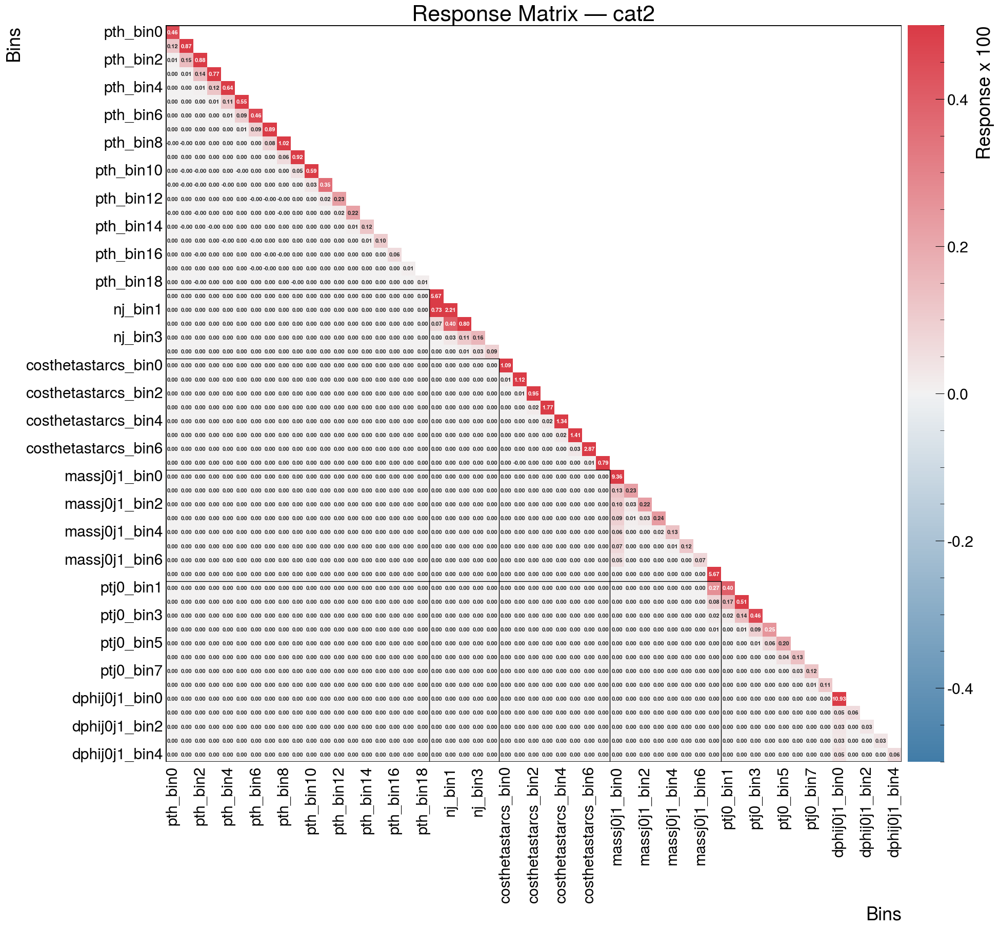

In [13]:
fig_corr, ax = plt.subplots(
    figsize=(24, 18),
    constrained_layout=True
)

cat = "cat2"

cmat = resp[cat]*100
corr_mask = np.triu(np.ones_like(cmat, dtype=bool), k=1)

sns.heatmap(
    cmat,
    ax=ax,
    cmap=palette,
    mask=corr_mask,
    vmin=-0.5,
    vmax=0.5,
    annot=True,
    fmt=".2f",
    center=0,
    square=True,
    annot_kws={"size": 8, "weight": "bold"},
    cbar_kws={"label": "Response x 100", "pad": 0.005},
)

ax.set_title(f"Response Matrix — {cat}")
ax.set_xlabel("Bins")
ax.set_ylabel("Bins")

_decorate_matrix_ax(ax, cmat.shape[0])

# plt.show()
plt.savefig(f"response_{cat}.pdf", dpi=300)

In [1052]:
# resp["cat0"].loc["rapidity_bin7", "rapidity_bin7"] = 0.001
# resp["cat0"].loc["rapidity_bin8", "rapidity_bin8"] = 0.001
# resp["cat0"].loc["rapidity_bin9", "rapidity_bin9"] = 0.001

# resp["cat1"].loc["rapidity_bin7", "rapidity_bin7"] = 0.001
# resp["cat1"].loc["rapidity_bin8", "rapidity_bin8"] = 0.001
# resp["cat1"].loc["rapidity_bin9", "rapidity_bin9"] = 0.001

In [1053]:
fisher_cat = {}

# Build the union of all row/column labels
all_rows = list(resp["cat2"].index)
all_cols = list(resp["cat2"].columns)


for cat in CAT:
    r = resp[cat]
    fisher_cat[cat] = r.T @ invert_matrix(cov[cat]) @ r # Without regularization of the covariance matrix before inversion
    # fisher_cat[cat] = r.T @ invert_matrix(tikhonov_regularize_for_inversion(cov[cat])[0]) @ r # With Tikhonov regularization before inversion

## Correlations per category
cov_gen_cat_0 = invert_matrix(fisher_cat["cat0"])
cov_gen_cat_1 = invert_matrix(fisher_cat["cat1"])
cov_gen_cat_2 = invert_matrix(fisher_cat["cat2"])
corr_gen_cat_0 = compute_corr(cov_gen_cat_0)
corr_gen_cat_1 = compute_corr(cov_gen_cat_1)
corr_gen_cat_2 = compute_corr(cov_gen_cat_2)

## Correlations per category using the formula without inversion of the correlation matrix
cov_gen_noinv_cat_0 = invert_matrix(resp['cat0']) @ cov["cat0"] @ invert_matrix(resp['cat0']).T
cov_gen_noinv_cat_1 = invert_matrix(resp['cat1']) @ cov["cat1"] @ invert_matrix(resp['cat1']).T
cov_gen_noinv_cat_2 = invert_matrix(resp['cat2']) @ cov["cat2"] @ invert_matrix(resp['cat2']).T
corr_gen_noinv_cat_0 = compute_corr(cov_gen_noinv_cat_0)
corr_gen_noinv_cat_1 = compute_corr(cov_gen_noinv_cat_1)
corr_gen_noinv_cat_2 = compute_corr(cov_gen_noinv_cat_2)

result = fisher_cat['cat2'].add(fisher_cat['cat1'], fill_value=0).add(fisher_cat['cat0'], fill_value=0)

## Correlations summing the three categories
cov_gen = invert_matrix(result)
# cov_gen = invert_matrix(tikhonov_regularize_for_inversion(fisher_cat["cat0"] + fisher_cat["cat1"] + fisher_cat["cat2"]))
cov_gen = pd.DataFrame(
    cov_gen,
    index=all_rows,
    columns=all_cols,
)

corr_gen = compute_corr(cov_gen)

####################################################################################################
# Checking the condition number of the various matrices
print("Covariance cat0: ", np.linalg.cond(cov["cat0"]), np.linalg.det(cov["cat0"]))
print("Covariance cat1: ", np.linalg.cond(cov["cat1"]), np.linalg.det(cov["cat1"]))
print("Covariance cat2: ", np.linalg.cond(cov["cat2"]), np.linalg.det(cov["cat2"]))
print("Response cat0: ", np.linalg.cond(resp["cat0"]), np.linalg.det(resp["cat0"]))
print("Response cat1: ", np.linalg.cond(resp["cat1"]), np.linalg.det(resp["cat1"]))
print("Response cat2: ", np.linalg.cond(resp["cat2"]), np.linalg.det(resp["cat2"]))
print("Sum of Fisher matrices: ", np.linalg.cond(result), np.linalg.det(result))



Covariance cat0:  86176.90914896941 2.280360932278864e+153
Covariance cat1:  847487.8934080169 -1.6576861940377523e+166
Covariance cat2:  87187.00310122766 6.24413929053801e+174
Response cat0:  513.1587268112063 1.7320515816269243e-118
Response cat1:  1218.9184850304819 1.8170817309212336e-113
Response cat2:  848.1250777546592 3.9505847303568454e-115
Sum of Fisher matrices:  9437815.493992442 -0.0


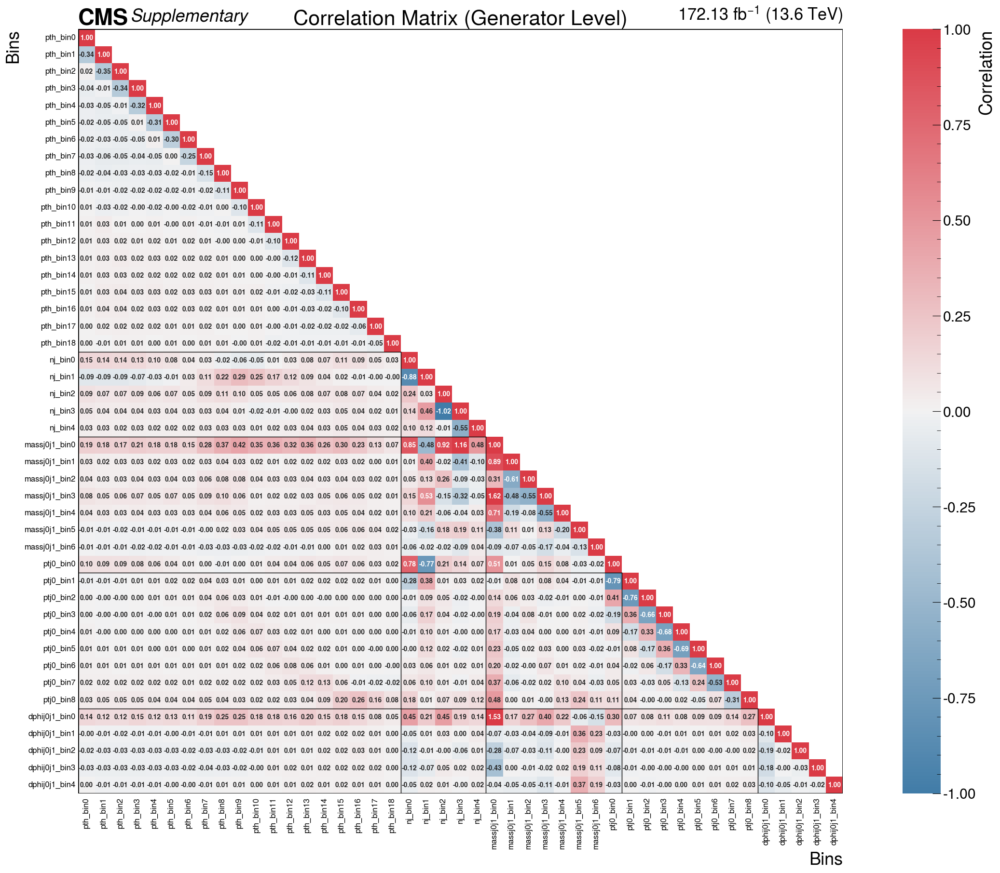

In [1054]:
plot_corr(corr_gen)

Condition number of resp_combined: 727.4142420858993
Gen-level execution complete. Rows/Cols match gen binning.


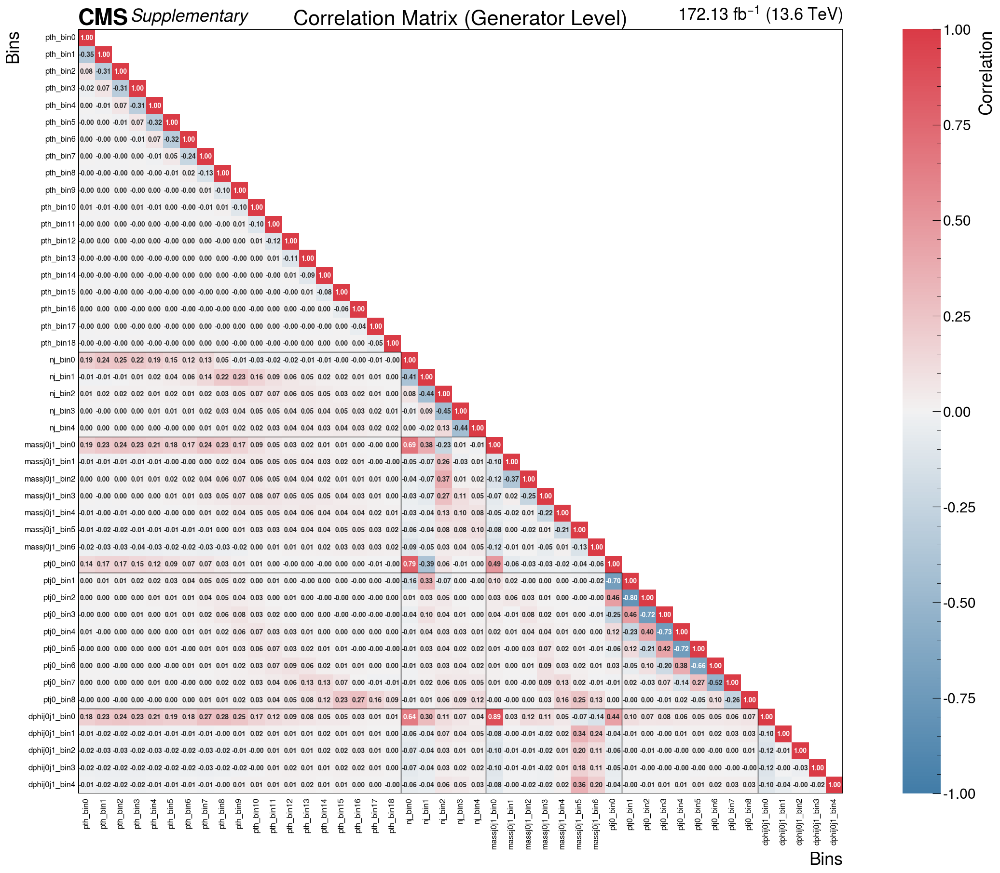

In [1055]:
import numpy as np
import pandas as pd
from scipy.linalg import cho_factor, cho_solve

# Define categories and extract structural labels
cats = ["cat0", "cat1", "cat2"]
all_rows = list(resp["cat0"].index)
all_cols = list(resp["cat0"].columns)

n_rows = len(all_rows)
n_cols = len(all_cols)
identity_rows = np.eye(n_rows)

# ---------------------------------------------------------------------
# 1. Compute the combined detector covariance matrix (cov_weighed)
#    Formula: cov_weighed = (cov["cat0"]^-1 + cov["cat1"]^-1 + cov["cat2"]^-1)^-1
# ---------------------------------------------------------------------
inv_cov_sum = np.zeros((n_rows, n_rows))

for c in cats:
    # Align detector-level covariance matrix
    cov_c = cov[c].reindex(index=all_rows, columns=all_rows, fill_value=0).to_numpy(float)
    
    # Stably compute inv(cov_c) using Cholesky factorization instead of explicit inversion
    try:
        c_factor, lower = cho_factor(cov_c, lower=True)
        inv_cov_c = cho_solve((c_factor, lower), identity_rows)
    except np.linalg.LinAlgError:
        inv_cov_c = np.linalg.solve(cov_c, identity_rows)
        
    inv_cov_sum += inv_cov_c

# Invert the sum stably to get the final weighted detector covariance matrix
try:
    sum_factor, lower = cho_factor(inv_cov_sum, lower=True)
    cov_weighed_mat = cho_solve((sum_factor, lower), identity_rows)
except np.linalg.LinAlgError:
    cov_weighed_mat = np.linalg.solve(inv_cov_sum, identity_rows)

cov_weighed = pd.DataFrame(cov_weighed_mat, index=all_rows, columns=all_rows)

# ---------------------------------------------------------------------
# 2. Compute the combined response matrix (resp_combined)
#    Using your exact element-wise inverse-variance logic
# ---------------------------------------------------------------------
R = np.stack([
    resp[c].reindex(index=all_rows, columns=all_cols, fill_value=0).to_numpy(float)
    for c in cats
])

V = np.stack([
    cov[c].reindex(index=all_rows, columns=all_cols, fill_value=np.inf).to_numpy(float)
    for c in cats
])

# Element-wise inverse-variance weights
w = 1.0 / np.clip(V, 1e-15, None)

# Weighted average
resp_combined_mat = np.sum(w * R, axis=0) / np.sum(w, axis=0)
resp_combined = pd.DataFrame(resp_combined_mat, index=all_rows, columns=all_cols)

print("Condition number of resp_combined:", np.linalg.cond(resp_combined_mat))

# ---------------------------------------------------------------------
# 3. Compute the combined gen-level covariance matrix (cov_gen_weighed)
#    Formula: cov_gen_weighed = inv(resp_combined) @ cov_weighed @ inv(resp_combined).T
# ---------------------------------------------------------------------
# We avoid explicit inversions of resp_combined by solving two sequential linear systems:
# Step A: Solve (resp_combined) @ Y = cov_weighed          => Y = inv(resp_combined) @ cov_weighed
# Step B: Solve (resp_combined) @ X = Y.T                  => X = inv(resp_combined) @ Y.T
try:
    Y = np.linalg.solve(resp_combined_mat, cov_weighed_mat)
    cov_gen_weighed_mat = np.linalg.solve(resp_combined_mat, Y.T)
except np.linalg.LinAlgError:
    # Robust fallback using least-squares if resp_combined is singular/ill-conditioned
    Y = np.linalg.lstsq(resp_combined_mat, cov_weighed_mat, rcond=None)[0]
    cov_gen_weighed_mat = np.linalg.lstsq(resp_combined_mat, Y.T, rcond=None)[0]

# Convert the resulting gen x gen matrix back to a DataFrame
cov_gen_weighed = pd.DataFrame(
    cov_gen_weighed_mat,
    index=all_cols,
    columns=all_cols,
)

# ---------------------------------------------------------------------
# 4. Downstream Visualization
# ---------------------------------------------------------------------
print("Gen-level execution complete. Rows/Cols match gen binning.")
plot_corr(corr_from_cov(cov_gen_weighed))

Here I try the great idea we had with Mauro, combining the covariance and response matrices

In [1056]:
# cov["cat0"] = cov["cat0"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])
# cov["cat1"] = cov["cat1"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])
# cov["cat2"] = cov["cat2"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])

# resp["cat0"] = resp["cat0"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])
# resp["cat1"] = resp["cat1"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])
# resp["cat2"] = resp["cat2"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])



# cov["cat0"] = cov["cat0"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])
# cov["cat1"] = cov["cat1"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])
# cov["cat2"] = cov["cat2"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])

# resp["cat0"] = resp["cat0"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])
# resp["cat1"] = resp["cat1"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])
# resp["cat2"] = resp["cat2"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])



727.4142420858993
['pth_bin0', 'pth_bin1', 'pth_bin2', 'pth_bin3', 'pth_bin4', 'pth_bin5', 'pth_bin6', 'pth_bin7', 'pth_bin8', 'pth_bin9', 'pth_bin10', 'pth_bin11', 'pth_bin12', 'pth_bin13', 'pth_bin14', 'pth_bin15', 'pth_bin16', 'pth_bin17', 'pth_bin18', 'nj_bin0', 'nj_bin1', 'nj_bin2', 'nj_bin3', 'nj_bin4', 'massj0j1_bin0', 'massj0j1_bin1', 'massj0j1_bin2', 'massj0j1_bin3', 'massj0j1_bin4', 'massj0j1_bin5', 'massj0j1_bin6', 'ptj0_bin0', 'ptj0_bin1', 'ptj0_bin2', 'ptj0_bin3', 'ptj0_bin4', 'ptj0_bin5', 'ptj0_bin6', 'ptj0_bin7', 'ptj0_bin8', 'dphij0j1_bin0', 'dphij0j1_bin1', 'dphij0j1_bin2', 'dphij0j1_bin3', 'dphij0j1_bin4']


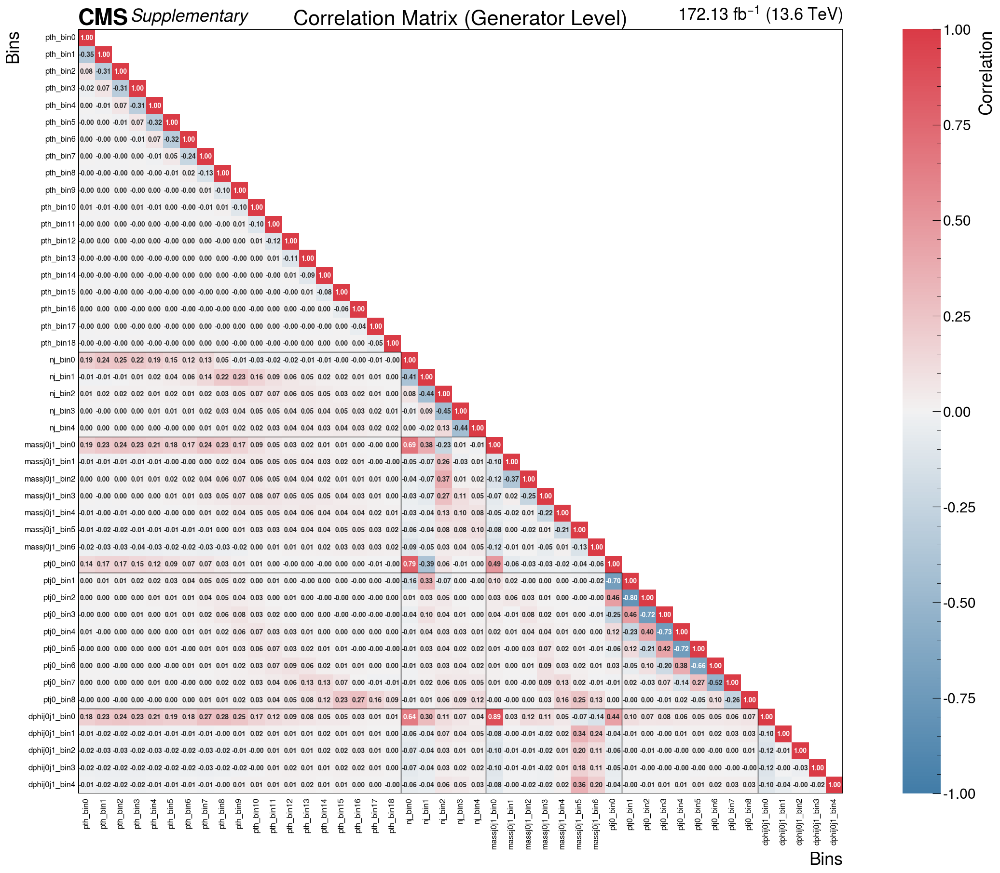

In [1057]:
## Compute the combined response matrix
## It is done by combining the covariance matrices of three independent measurements 
## cov_weighed = (cov["cat0"]^-1 + cov["cat1"]^-1 + cov["cat2"]^-1)^-1
cov_weighed = invert_matrix(invert_matrix(cov["cat0"]).add(invert_matrix(cov["cat1"]), fill_value=0).add(invert_matrix(cov["cat2"]), fill_value=0))
# plot_corr(corr_from_cov(cov_weighed))
# ## Compute the combined response matrix
# ## It is done by taking the weighed average element by element of the three response matrices
# ## The weights correspond to the corresponding covariances
cats = ["cat0", "cat1", "cat2"]
# R = np.stack([np.asarray(resp[c], float) for c in cats])   
# V = np.stack([np.asarray(cov[c],  float) for c in cats])   
# w = 1.0 / np.clip(V, 1e-15, None)                         
# resp_combined = np.sum(w * R, axis=0) / np.sum(w, axis=0)
# resp_combined = pd.DataFrame(resp_combined, index=resp["cat0"].index, columns=resp["cat0"].columns)


# Build the union of all row/column labels
all_rows = list(resp["cat0"].index)
all_cols = list(resp["cat0"].columns)

# Align all matrices to the same shape
R = np.stack([
    resp[c].reindex(index=all_rows, columns=all_cols, fill_value=0).to_numpy(float)
    for c in cats
])

V = np.stack([  
    cov[c].reindex(index=all_rows, columns=all_cols, fill_value=np.inf).to_numpy(float)
    for c in cats
])

# Inverse-variance weights
w = 1.0 / np.clip(V, 1e-15, None)

# Weighted average
resp_combined = np.sum(w * R, axis=0) / np.sum(w, axis=0)

# Convert back to DataFrame
resp_combined = pd.DataFrame(
    resp_combined,
    index=all_rows,
    columns=all_cols,
)
print(np.linalg.cond(resp_combined))

cov_gen_weighed = invert_matrix(resp_combined) @ cov_weighed @ invert_matrix(resp_combined).T

print(all_rows)

plot_corr(corr_from_cov(cov_gen_weighed))

In [14]:
# def _robust_cholesky(C, regularisation=1e-10, max_tries=8):
#     C = np.asarray(C, dtype=float)
#     C = 0.5 * (C + C.T)  # enforce symmetry
#     scale = max(np.linalg.norm(C, ord=2), 1.0)
#     eps = regularisation * scale
#     I = np.eye(C.shape[0])
#     for _ in range(max_tries):
#         print("iteration for cholesky with eps = ", eps)
#         try:
#             return np.linalg.cholesky(C + eps * I), eps
#         except np.linalg.LinAlgError:
#             eps *= 10
#     print("Fallback solution for computing the Cholesky decomposition")
#     # Fallback: eigenvalue clipping to nearest SPD-like matrix
#     w, v = np.linalg.eigh(C)
#     w = np.clip(w, eps, None)
#     # w = np.clip(w, 1e-15, None)
#     C_spd = (v * w) @ v.T
#     return np.linalg.cholesky(C_spd), eps

def _nearest_spd(C, epsilon_rel=1e-10):
    """
    Project C onto the nearest symmetric positive-definite matrix
    using eigenvalue reflection. Only negative/near-zero eigenvalues
    are corrected — the bulk of the spectrum is untouched.
    """
    C = 0.5 * (C + C.T)
    w, v = np.linalg.eigh(C)
    
    # Shift: only what's needed to clear zero, plus a tiny relative floor
    min_positive = epsilon_rel * w.max()
    if w.min() >= min_positive:
        return C  # already PSD, nothing to do
    
    w_fixed = np.maximum(w, min_positive)
    return (v * w_fixed) @ v.T


def _robust_cholesky(C, regularisation=1e-10, max_tries=8):
    C = np.asarray(C, dtype=float)
    C = 0.5 * (C + C.T)
    scale = max(np.linalg.norm(C, ord=2), 1.0)
    eps = regularisation * scale
    I = np.eye(C.shape[0])
        
    for _ in range(max_tries):
        print("iteration for cholesky with eps = ", eps)
        try:
            return np.linalg.cholesky(C + eps * I), eps
        except np.linalg.LinAlgError:
            eps *= 10
    
    # Fallback: nearest SPD via eigenvalue floor — minimal intervention
    print(f"Warning: Cholesky fallback triggered (min eigenvalue requires "
          f"shift > {eps/10:.3e}). Using nearest-SPD projection.")
    C_spd = _nearest_spd(C, epsilon_rel=regularisation)
    return np.linalg.cholesky(C_spd), regularisation * scale

def compute_C_gen(R_list, C_list, bin_names=None, regularisation=1e-10):
    """
    Compute the gen-level statistical covariance and correlation matrices.

    Parameters
    ----------
    R_list         : list of response matrices (DataFrames or arrays)
                     each shaped (n_reco_k, n_gen_k)
    C_list         : list of reco covariance matrices
                     each shaped (n_reco_k, n_reco_k)
    bin_names      : optional ordered list of gen-bin labels
    regularisation : float, diagonal loading factor

    Returns
    -------
    dict with keys:
        "covariance"   : pd.DataFrame
        "correlation"  : pd.DataFrame
    """

    # ---------------------------------------------------------
    # Determine common gen-bin ordering
    # Preserve ordering from first matrix, append missing bins
    # ---------------------------------------------------------

    if isinstance(R_list[0], pd.DataFrame):
        all_gen_bins = list(R_list[0].columns)

        for R in R_list[1:]:
            for col in R.columns:
                if col not in all_gen_bins:
                    all_gen_bins.append(col)
    else:
        if bin_names is None:
            raise ValueError(
                "bin_names must be provided when R_list elements are not DataFrames"
            )
        all_gen_bins = list(bin_names)

    # ---------------------------------------------------------
    # Build whitened response matrices
    # ---------------------------------------------------------

    R_tilde_list = []

    for k, (R_k, C_k) in enumerate(zip(R_list, C_list)):

        # ---------------------------------------------
        # Align response matrix columns
        # Missing bins are filled with zeros
        # ---------------------------------------------

        if isinstance(R_k, pd.DataFrame):
            R_k = (
                R_k
                .reindex(columns=all_gen_bins, fill_value=0)
                .to_numpy(float)
            )
        else:
            R_k = np.asarray(R_k, float)

        # ---------------------------------------------
        # Convert covariance matrix
        # ---------------------------------------------

        if isinstance(C_k, pd.DataFrame):
            C_k = C_k.to_numpy(float)
        else:
            C_k = np.asarray(C_k, float)

        # ---------------------------------------------
        # Robust Cholesky whitening
        # ---------------------------------------------
        
        max_tries = 8
        
        # if k > 0:
        #     max_tries += 4

        L_k, eps_used = _robust_cholesky(
            C_k,
            regularisation=regularisation,
            max_tries=max_tries
        )

        R_tilde_k = solve_triangular(
            L_k,
            R_k,
            lower=True
        )

        R_tilde_list.append(R_tilde_k)
    
    # ---------------------------------------------------------
    # Stack all categories
    # Shape: (sum reco bins, n_gen_total)
    # ---------------------------------------------------------

    # # Naive weighting
    # R_tilde_list[0] *=0.5
    # R_tilde_list[1] *=0.25
    # R_tilde_list[2] *=0.25

    R_tot = np.vstack(R_tilde_list)
    
    # ---------------------------------------------------------
    # QR decomposition
    # ---------------------------------------------------------

    _, R_QR = qr(R_tot, mode='economic')

    n_gen = R_QR.shape[0]

    # ---------------------------------------------------------
    # Compute covariance
    # ---------------------------------------------------------

    R_QR_inv = solve_triangular(
        R_QR,
        np.eye(n_gen),
        lower=False
    )

    C_gen = R_QR_inv @ R_QR_inv.T

    # ---------------------------------------------------------
    # Correlation matrix
    # ---------------------------------------------------------

    std = np.sqrt(np.diag(C_gen))

    corr = np.clip(
        C_gen / np.outer(std, std),
        -1.0,
        1.0
    )

    # # 1. Check information contributions per category
    # for k, (R_k, C_k) in enumerate(zip(R_list, C_list)):
    #     R_arr = R_k.to_numpy(float)
    #     C_arr = C_k.to_numpy(float)
    #     max_tries = 4
    #     if k > 0: 
    #         max_tries += 4
    #     L, _ = _robust_cholesky(C_arr, max_tries=max_tries)
    #     Rt = solve_triangular(L, R_arr, lower=True)
    #     info_k = Rt.T @ Rt
    #     print(f"cat{k} information matrix trace: {np.trace(info_k):.4f}")

    # # 2. Check shapes
    # print("R_tot shape:", R_tot.shape)
    # print("R_QR shape:", R_QR.shape)
    # print("n_gen:", n_gen)

    # # 3. Check column alignment
    # print("all_gen_bins:", all_gen_bins)
    # print("bin_names:", list(bin_names))


    # ---------------------------------------------------------
    # Labels
    # ---------------------------------------------------------

    if bin_names is None:
        bin_names = all_gen_bins

    return {
        "covariance": pd.DataFrame(
            C_gen,
            index=bin_names,
            columns=bin_names
        ),

        "correlation": pd.DataFrame(
            corr,
            index=bin_names,
            columns=bin_names
        ),
    }

In [15]:
mat_cholesky = compute_C_gen(
    [resp["cat0"], resp["cat1"], resp["cat2"]],
    [cov["cat0"], cov["cat1"], cov["cat2"]],
    bin_names = cov["cat0"].index,
    regularisation=1e-10 # 1e-10
)

iteration for cholesky with eps =  6.963237930139781e-05
iteration for cholesky with eps =  0.00015376887564846152
iteration for cholesky with eps =  0.0015376887564846151
iteration for cholesky with eps =  0.015376887564846151
iteration for cholesky with eps =  0.1537688756484615
iteration for cholesky with eps =  1.5376887564846151
iteration for cholesky with eps =  15.37688756484615
iteration for cholesky with eps =  153.76887564846152
iteration for cholesky with eps =  1537.6887564846152
iteration for cholesky with eps =  0.0002516956534709267
iteration for cholesky with eps =  0.002516956534709267
iteration for cholesky with eps =  0.025169565347092672
iteration for cholesky with eps =  0.2516956534709267
iteration for cholesky with eps =  2.516956534709267
iteration for cholesky with eps =  25.16956534709267
iteration for cholesky with eps =  251.69565347092671


In [16]:
cor_cholesky = mat_cholesky["correlation"]
# label_to_drop = [cor_cholesky.index[34],cor_cholesky.index[43]]
# cor_cholesky_red = cor_cholesky.drop(index=label_to_drop, columns=label_to_drop)


/tmp/ipykernel_894040/1859877891.py:72: FutureWarning: ``set_style`` is deprecated: Naming convention is changing to match mpl. Use ``mplhep.style.use()``.
  hep.set_style("CMS")


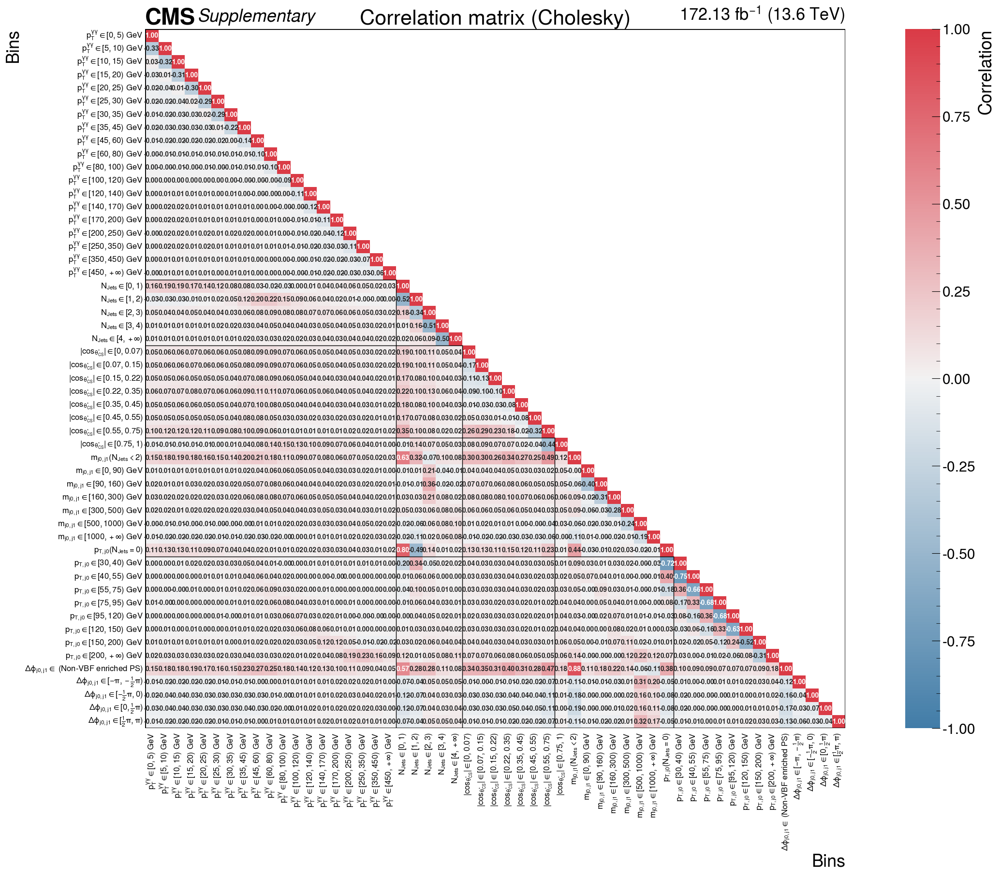

In [17]:
# plot_corr(cor_cholesky, title="Correlation matrix (Cholesky)", save_path="correlation_matrix_cholesky.pdf", label_map=label_map, n_b4=b4-1)
plot_corr(cor_cholesky, title="Correlation matrix (Cholesky)", save_path="correlation_matrix_cholesky.pdf", label_map=label_map, n_b3=b3-1, n_b4=b4)

### Adding systematic uncertainties

In [1062]:
with open ("/t3home/niharrin/devel/work/devel/RCR_Matrix/impacts/impacts_PTJ0.json", "r") as f:
    impacts_ptJ0 = json.load(f)

with open ("/t3home/niharrin/devel/work/devel/RCR_Matrix/impacts/impacts_PTH.json", "r") as f:
    impacts_PTH = json.load(f)

with open ("/t3home/niharrin/devel/work/devel/RCR_Matrix/impacts/impacts_NJ.json", "r") as f:
    impacts_NJ = json.load(f)

# with open ("/t3home/niharrin/devel/work/devel/RCR_Matrix/impacts/impacts_YH.json", "r") as f:
#     impacts_YH = json.load(f)

with open ("/t3home/niharrin/devel/work/devel/RCR_Matrix/impacts/impacts_DPhiJ0J1.json", "r") as f:
    impacts_DPhiJ0J1 = json.load(f)
    
with open ("/t3home/niharrin/devel/work/devel/RCR_Matrix/impacts/impacts_MassJ0J1.json", "r") as f:
    impacts_MassJ0J1 = json.load(f)

In [1063]:
nuis_params = set()
# Printout the list of nuisance parameters
# For debugging purposes
# with open("impact_param_names.txt", "w") as f:
#   f.write("[PTH]\n")
#   f.writelines(p["name"] + "\n" for p in impacts_PTH["params"])
#   f.write("\n[NJ]\n")
#   f.writelines(p["name"] + "\n" for p in impacts_NJ["params"])
#   f.write("\n[ptJ0]\n")
#   f.writelines(p["name"] + "\n" for p in impacts_ptJ0["params"])
#   f.write("\n[YH]\n")
#   f.writelines(p["name"] + "\n" for p in impacts_YH["params"])

sections = {
    "PTH": impacts_PTH,
    "NJ": impacts_NJ,
    "MassJ0J1": impacts_MassJ0J1,
    "ptJ0": impacts_ptJ0,
    # "YH": impacts_YH,
    "DPhiJ0J1": impacts_DPhiJ0J1,
}

with open("impact_param_names.txt", "w") as f:
    for label, impacts in sections.items():
        f.write(f"[{label}]\n")

        for p in impacts.get("params", []):
            name = p.get("name", "")
            f.write(name + "\n")
            nuis_params.add(name)

        f.write("\n")

nuis_params = sorted(nuis_params)  # optional: deterministic order

In [1064]:
import json

pois = {
    "PTH": ["r_PTH_0p0_5p0","r_PTH_5p0_10p0","r_PTH_10p0_15p0","r_PTH_15p0_20p0","r_PTH_20p0_25p0","r_PTH_25p0_30p0","r_PTH_30p0_35p0","r_PTH_35p0_45p0","r_PTH_45p0_60p0","r_PTH_60p0_80p0","r_PTH_80p0_100p0","r_PTH_100p0_120p0","r_PTH_120p0_140p0","r_PTH_140p0_170p0","r_PTH_170p0_200p0","r_PTH_200p0_250p0","r_PTH_250p0_350p0","r_PTH_350p0_450p0","r_PTH_450p0_10000p0"],
    "NJ": ["r_NJ_0p0_1p0", "r_NJ_1p0_2p0", "r_NJ_2p0_3p0", "r_NJ_3p0_4p0", "r_NJ_4p0_100p0"],
    "MassJ0J1": ["r_MassJ0J1_m10000p0_0p0", "r_MassJ0J1_0p0_90p0", "r_MassJ0J1_90p0_160p0", "r_MassJ0J1_160p0_300p0", "r_MassJ0J1_300p0_500p0", "r_MassJ0J1_500p0_1000p0", "r_MassJ0J1_1000p0_10000p0"],
    "PTJ0": ["r_PTJ0_m10000p0_30p0", "r_PTJ0_30p0_40p0", "r_PTJ0_40p0_55p0", "r_PTJ0_55p0_75p0", "r_PTJ0_75p0_95p0", "r_PTJ0_95p0_120p0", "r_PTJ0_120p0_150p0", "r_PTJ0_150p0_200p0", "r_PTJ0_200p0_10000p0"],
    # "YH": ["r_YH_0p0_0p15", "r_YH_0p15_0p3", "r_YH_0p3_0p45", "r_YH_0p45_0p6", "r_YH_0p6_0p75", "r_YH_0p75_0p9", "r_YH_0p9_1p2", "r_YH_1p2_1p6", "r_YH_1p6_2p0", "r_YH_2p0_2p5"],
    "DPhiJ0J1": ["r_DPhiJ0J1_m3p1416_3p1416_underflow", "r_DPhiJ0J1_m3p1416_m1p5708", "r_DPhiJ0J1_m1p5708_0p0", "r_DPhiJ0J1_0p0_1p5708", "r_DPhiJ0J1_1p5708_3p1416"],

}

In [1065]:
idx_ptJ0 = {p["name"]: p for p in impacts_ptJ0["params"]}
idx_PTH  = {p["name"]: p for p in impacts_PTH["params"]}
idx_NJ   = {p["name"]: p for p in impacts_NJ["params"]}
# idx_YH   = {p["name"]: p for p in impacts_YH["params"]}
idx_DPhiJ0J1   = {p["name"]: p for p in impacts_DPhiJ0J1["params"]}
idx_MassJ0J1   = {p["name"]: p for p in impacts_MassJ0J1["params"]}

def variation(v):
    v0, v1, v2 = map(float, v)
    d1 = v2 - v1   # +1σ
    d2 = v0 - v1   # -1σ
    return np.sign(d1) * max(abs(d1), abs(d2))
    # return (d1 - d2) / 2
    # return d1

def block_vector(entry, pois):
    if entry is None:
        return [0.0] * len(pois)
    return [variation(entry[poi]) if poi in entry else 0.0 for poi in pois]

nuis_to_vector = {}
for n in nuis_params:  # full list you provide
    e_PTH  = idx_PTH.get(n)     # None if missing
    e_NJ   = idx_NJ.get(n)
    e_ptJ0 = idx_ptJ0.get(n)
    # e_YH = idx_YH.get(n)
    e_MassJ0J1 = idx_MassJ0J1.get(n)
    e_DPhiJ0J1 = idx_DPhiJ0J1.get(n)
    vec = (
        block_vector(e_PTH,  pois["PTH"]) +
        block_vector(e_NJ,   pois["NJ"]) +
        block_vector(e_MassJ0J1, pois["MassJ0J1"]) +
        block_vector(e_ptJ0, pois["PTJ0"]) +
        # block_vector(e_YH, pois["YH"]) +
        block_vector(e_DPhiJ0J1, pois["DPhiJ0J1"])
    )
    nuis_to_vector[n] = np.array(vec, dtype=float).reshape(-1, 1)  # vertical


In [1066]:
## After this cell you have syst_matrix and syst_matrix_reduced
n_entries = len(pois["PTJ0"]) + len(pois["PTH"]) + len(pois["NJ"]) + len(pois["DPhiJ0J1"]) + len(pois['MassJ0J1'])# + len(pois["YH"])
syst_matrix = np.zeros((n_entries, n_entries))
for nuis in nuis_params:
# for nuis in ["CMS_scale_j_2022postEE", "CMS_scale_j_2022preEE"]:
    syst_matrix += nuis_to_vector[nuis] @ nuis_to_vector[nuis].T

syst_matrix = pd.DataFrame(syst_matrix, index=cor_cholesky.index, columns=cor_cholesky.columns)
syst_matrix.index = cor_cholesky.index
syst_matrix.columns = cor_cholesky.index

In [1067]:
def find_crossings(x_vals, y_vals, threshold=1.0):
    # Find where the difference changes sign
    y_vals = np.array(y_vals)  # ← add this line
    signs = np.sign(y_vals - threshold)
    crossings = []
    for i in range(len(signs)-1):
        if signs[i] * signs[i+1] <= 0:  # Sign change detected
            # Linear interpolation
            x1, x2 = x_vals[i], x_vals[i+1]
            y1, y2 = y_vals[i], y_vals[i+1]
            if y1 != y2:  # Avoid division by zero
                x_cross = x1 + (x2-x1) * (threshold-y1)/(y2-y1)
                crossings.append(x_cross)
    return crossings

In [1068]:
fidXS_PTH = [3.251514094855517, 6.413825763609831, 6.555809968521467, 5.889800810939074, 5.099083112515962, 4.421885114513488, 3.866226543790849, 6.441680337807897, 6.902988952146682, 5.9025422289283505, 3.8146832368240626, 2.5035992765212907, 1.728313772250199, 1.7476552427460155, 1.0831025476943583, 1.0182794676925542, 0.8199434493201138, 0.25644320024731754, 0.16456440773573974]
fidXS_NJ = [36.46013279924294, 19.39595337442149, 8.780897688557815, 2.1285339711776765, 1.117648241828872]
fidXS_PTJ0 = [36.46013279924294, 6.663873021305533, 7.050146523728949, 5.894645706317997, 3.654783295750552, 2.8293975792219843, 1.990389506704825, 1.6537018867095121, 1.6860957562438337] 
fidXS_YH = [6.571010820445315, 6.4878499407752805, 6.374530083157725, 6.159720064093899, 5.79610179997262, 5.471530119936904, 9.913956621106973, 10.81253639411838, 7.0842765398757725, 3.211653691747486]
fidXS_DPhiJ0J1 = [65.21952099254116, 0.8106934454948248, 0.5284340993292949, 0.5398399759381666, 0.7845488948952335] # Contains underflow bin
fidXS_MassJ0J1 = [55.85608617367116, 2.2380721011996636, 2.5389486049125436, 2.7327747094066046, 1.7825497135586612, 1.6804738870094658, 1.054260885476261] 
# fidXS_DPhiJ0J1 = [0.8106934454948248, 0.5284340993292949, 0.5398399759381666, 0.7845488948952335] # Does NOT contains underflow bin

# We always take the bigger ones to be more conservative
uncMu_total_PTH = [0.481, 0.339, 0.355, 0.365, 0.410, 0.446, 0.457, 0.300, 0.258, 0.249, 0.260, 0.284, 0.305, 0.251, 0.287, 0.259, 0.259, 0.429, 0.582]
uncMu_stat_PTH = [0.480, 0.337, 0.354, 0.364, 0.406, 0.442, 0.455, 0.298, 0.256, 0.247, 0.258, 0.283, 0.304, 0.250, 0.285, 0.258, 0.258, 0.427, 0.580]
unc_total_PTH = [uncMu_total_PTH[i]*currentXS for i, currentXS in enumerate(fidXS_PTH)]
unc_stat_PTH = [uncMu_stat_PTH[i]*currentXS for i, currentXS in enumerate(fidXS_PTH)]
unc_syst_PTH = [np.sqrt(unc_total_PTH[i]**2 - unc_stat_PTH[i]**2) for i, _ in enumerate(unc_total_PTH)]

uncMu_total_NJ = [0.150, 0.223, 0.315, 0.672, 0.619]
uncMu_stat_NJ = [0.145, 0.220, 0.311, 0.665, 0.614]
unc_total_NJ = [uncMu_total_NJ[i]*currentXS for i, currentXS in enumerate(fidXS_NJ)]
unc_stat_NJ = [uncMu_stat_NJ[i]*currentXS for i, currentXS in enumerate(fidXS_NJ)]
unc_syst_NJ = [np.sqrt(unc_total_NJ[i]**2 - unc_stat_NJ[i]**2) for i, _ in enumerate(unc_total_NJ)]

uncMu_total_PTJ0 = [0.163, 0.958, 0.841, 0.751, 0.964, 0.927, 0.854, 0.594, 0.349]
uncMu_stat_PTJ0 = [0.155, 0.954, 0.836, 0.747, 0.960, 0.922, 0.851, 0.591, 0.346]
unc_total_PTJ0 = [uncMu_total_PTJ0[i]*currentXS for i, currentXS in enumerate(fidXS_PTJ0)]
unc_stat_PTJ0 = [uncMu_stat_PTJ0[i]*currentXS for i, currentXS in enumerate(fidXS_PTJ0)]
unc_syst_PTJ0 = [np.sqrt(unc_total_PTJ0[i]**2 - unc_stat_PTJ0[i]**2) for i, _ in enumerate(unc_total_PTJ0)]

uncMu_total_YH = [0.190, 0.202, 0.211, 0.227, 0.253, 0.273, 0.236, 0.305, 0.411, 0.709]
uncMu_stat_YH = [0.188, 0.201, 0.210, 0.226, 0.252, 0.271, 0.234, 0.303, 0.409, 0.706]
unc_total_YH = [uncMu_total_YH[i]*currentXS for i, currentXS in enumerate(fidXS_YH)]
unc_stat_YH = [uncMu_stat_YH[i]*currentXS for i, currentXS in enumerate(fidXS_YH)]
unc_syst_YH = [np.sqrt(unc_total_YH[i]**2 - unc_stat_YH[i]**2) for i, _ in enumerate(unc_total_YH)]

uncMu_total_DPhiJ0J1 = [0.088, 0.616, 0.571, 0.566, 0.646]
uncMu_stat_DPhiJ0J1 = [0.083, 0.610, 0.563, 0.557, 0.640]
unc_total_DPhiJ0J1 = [uncMu_total_DPhiJ0J1[i]*currentXS for i, currentXS in enumerate(fidXS_DPhiJ0J1)]
unc_stat_DPhiJ0J1 = [uncMu_stat_DPhiJ0J1[i]*currentXS for i, currentXS in enumerate(fidXS_DPhiJ0J1)]
unc_syst_DPhiJ0J1 = [np.sqrt(unc_total_DPhiJ0J1[i]**2 - unc_stat_DPhiJ0J1[i]**2) for i, _ in enumerate(unc_total_DPhiJ0J1)]

uncMu_total_MassJ0J1 = [0.099, 0.499, 0.667, 0.562, 0.638, 0.518, 0.409] # Subject to change
uncMu_stat_MassJ0J1 = [0.094, 0.494, 0.660, 0.559, 0.634, 0.514, 0.399] # Subject to change
unc_total_MassJ0J1 = [uncMu_total_MassJ0J1[i]*currentXS for i, currentXS in enumerate(fidXS_MassJ0J1)]
unc_stat_MassJ0J1 = [uncMu_stat_MassJ0J1[i]*currentXS for i, currentXS in enumerate(fidXS_MassJ0J1)]
unc_syst_MassJ0J1 = [np.sqrt(unc_total_MassJ0J1[i]**2 - unc_stat_MassJ0J1[i]**2) for i, _ in enumerate(unc_total_MassJ0J1)]


# Mangels Geduld... (to be changed)
# unc_stat_syst = unc_total["PTH"] + unc_total["NJ"] + unc_total["PTJ0"] + unc_total["YH"]

unc_stat = unc_stat_PTH + unc_stat_NJ + unc_stat_MassJ0J1 + unc_stat_PTJ0 + unc_stat_DPhiJ0J1 # + unc_stat_YH
unc_syst = unc_syst_PTH + unc_syst_NJ + unc_syst_MassJ0J1 + unc_syst_PTJ0 + unc_syst_DPhiJ0J1 # + unc_syst_YH


In [1069]:
cov_stat = cor_cholesky * np.outer(unc_stat, unc_stat)
# cov_stat = corr_from_cov(cov_gen_weighed) * np.outer(unc_stat, unc_stat)


# cov_syst = corr_from_cov(syst_matrix) * np.outer(unc_syst, unc_syst)
cov_syst = syst_matrix

# Remove underflow bin of PTJ0
cov_stat = cov_stat.drop(index=["ptj0_bin0", "dphij0j1_bin0", 'massj0j1_bin0'], columns=["ptj0_bin0", "dphij0j1_bin0", 'massj0j1_bin0'])
cov_syst = cov_syst.drop(index=["ptj0_bin0", "dphij0j1_bin0", 'massj0j1_bin0'], columns=["ptj0_bin0", "dphij0j1_bin0", 'massj0j1_bin0'])

# cov_stat = cor_cholesky * np.outer(unc_stat_syst, unc_stat_syst)
# cov_syst = syst_matrix * np.outer(unc_stat_syst, unc_stat_syst)
cov_tot = cov_stat + cov_syst
corr_tot = corr_from_cov(cov_tot)
# plot_corr(corr_tot, title="Total correlation matrix (stat + syst)", save_path="correlation_matrix_statsyst_combined.pdf", label_map=label_map, n_b4=b4-1)

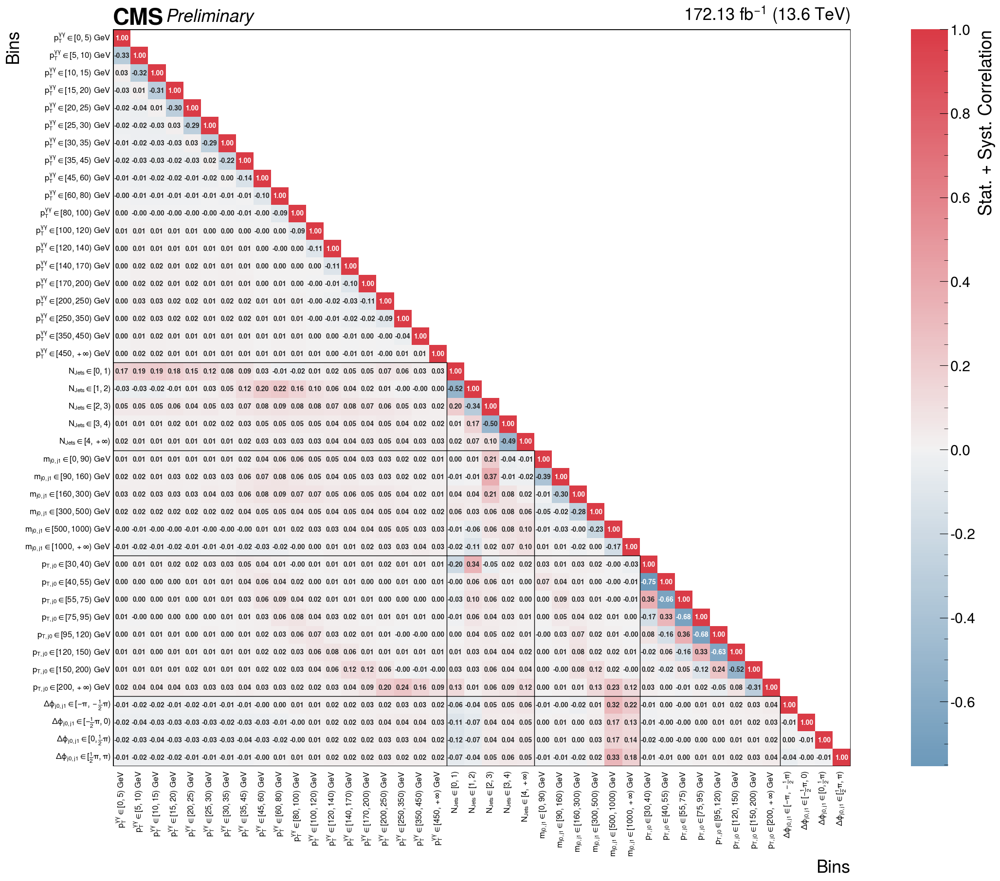

In [1070]:
plot_cov(corr_tot, title="", save_path="correlation_matrix_statsyst_combined.pdf", cms_label="Preliminary", plot_label=r"Stat. + Syst. Correlation", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-2) #

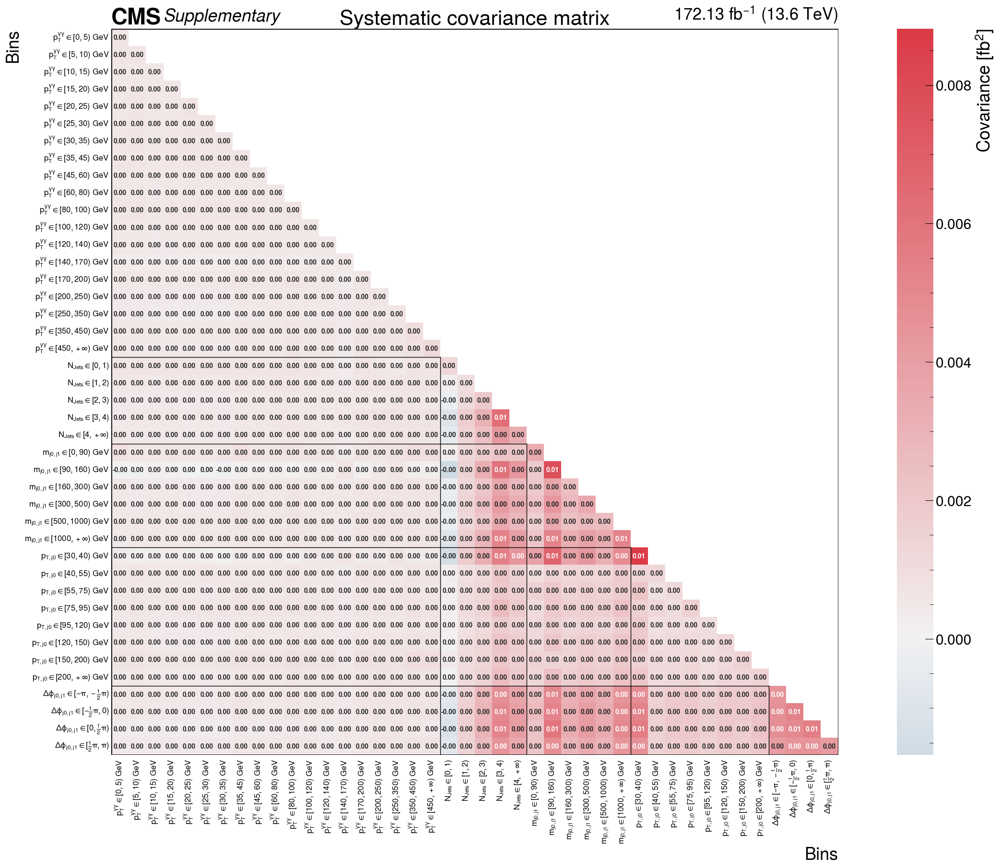

In [1071]:
plot_cov(cov_syst, title="Systematic covariance matrix", save_path="covariance_matrix_systematic_combined.pdf", label_map=label_map, n_b3=b3-2, n_b4=b4-2)

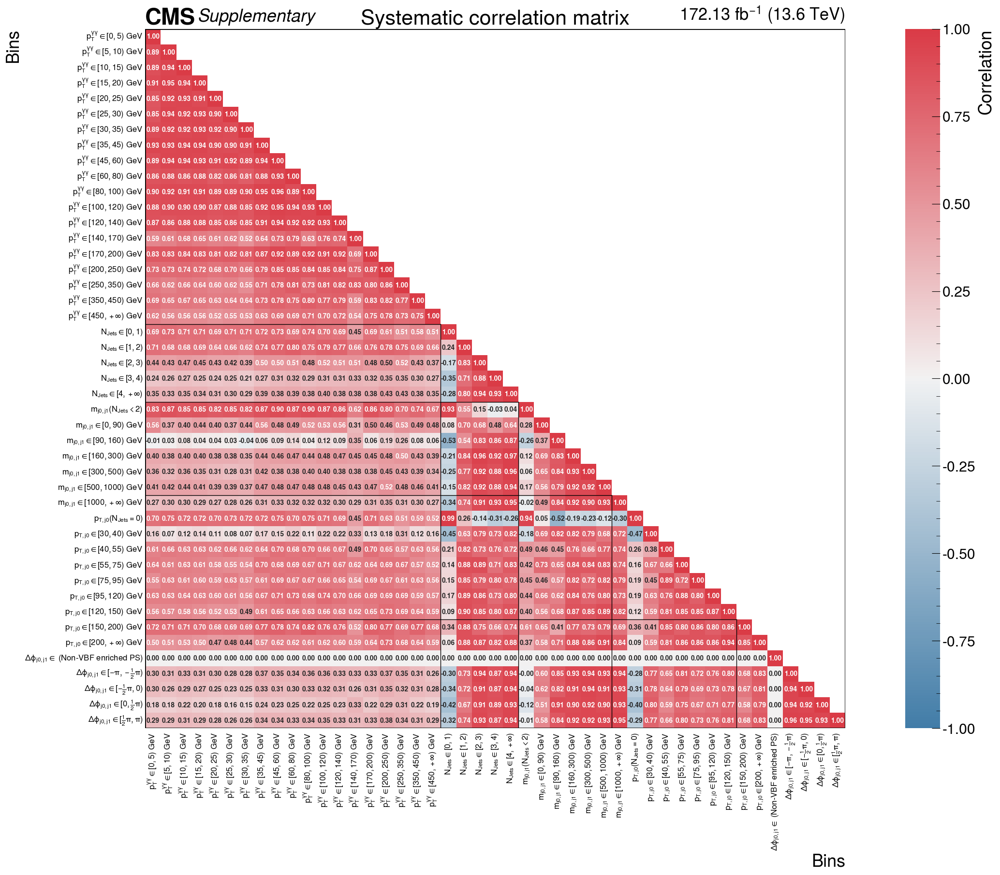

In [1072]:
plot_corr(corr_from_cov(syst_matrix), title="Systematic correlation matrix", save_path="correlation_matrix_systematic_combined.pdf", label_map=label_map, n_b3=b3-2, n_b4=b4-2)

#### Theory covariance matrix

In [1073]:
# first, load the variances for alpha s and PDF as discussed with AT

FILE_RE = re.compile(
    # r"^fidXS_(?P<obs>NJ|PTH|PTJ0|YH|DPhiJ0J1)_all\.py$"
    r"^fidXS_(?P<obs>PTH|NJ|MassJ0J1|PTJ0|DPhiJ0J1)_all\.py$"
)


def load_python_module(path: Path):
    spec = importlib.util.spec_from_file_location(path.stem, path)
    if spec is None or spec.loader is None:
        raise RuntimeError(f"Cannot load file: {path}")
    module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(module)
    return module

var = {
    "alpha": {
        "PTH": [],
        "NJ": [],
        "MassJ0J1": [],
        "PTJ0": [],
        # "YH": [],
        "DPhiJ0J1": [],

    },
    "pdf": {
        "PTH": [],
        "NJ": [],
        "MassJ0J1": [],
        "PTJ0": [],
        # "YH": [],
        "DPhiJ0J1": [],
    }
}

fidXS_folder = Path("fidXS")

for path in fidXS_folder.iterdir():
    match = FILE_RE.match(path.name)
    if not match:
        continue

    obs = match.group("obs")
    
    module = load_python_module(path)

    if not hasattr(module, "fidXS"):
        print(f"Skipping {path.name}: no fidXS vector")
        continue    

    fid_xs_nom = np.array(list(module.fidXS))  # convert once to numpy
    fid_xs_pdf_up = np.array(list(module.fidXS_pdf_up))
    fid_xs_alpha_up = np.array(list(module.fidXS_alpha_up))

    fid_xs_pdf_dn = np.array(list(module.fidXS_pdf_dn))
    fid_xs_alpha_dn = np.array(list(module.fidXS_alpha_dn))
  
    for i, nom_xs in enumerate(fid_xs_nom):
        if ((obs == "PTJ0") or (obs == "DPhiJ0J1") or (obs == "MassJ0J1")) and (i == 0):
            # Get rid of the underflow bins
            continue
        var["alpha"][obs].append(fid_xs_alpha_up[i] - fid_xs_nom[i])
        var["pdf"][obs].append(fid_xs_pdf_up[i] - fid_xs_nom[i])

In [1074]:
# We fully correlate the Alpha S and PDF uncertainties

# Build the correlation matrix
n_bins = len(var["alpha"]["PTH"]) + len(var["alpha"]["NJ"]) + len(var["alpha"]["PTJ0"]) + len(var["alpha"]["DPhiJ0J1"]) + len(var["alpha"]["MassJ0J1"])# + len(var["alpha"]["YH"])
matrix = np.ones((n_bins, n_bins), dtype=int)

# Use the dictionary values (or keys) as labels
labels = list(label_map.values())

# Drop underflow bins
labels.remove("r_PTJ0_m10000p0_30p0")
labels.remove("r_DPhiJ0J1_m3p1416_3p1416_underflow")
labels.remove("r_MassJ0J1_m10000p0_0p0")

correlation = pd.DataFrame(
    matrix,
    index=labels,
    columns=labels
)


In [1075]:
# Build the global ordered list of bins
all_bins = []
for obs in pois:
    all_bins.extend(pois[obs])

all_bins.remove("r_PTJ0_m10000p0_30p0")
all_bins.remove("r_DPhiJ0J1_m3p1416_3p1416_underflow")
all_bins.remove("r_MassJ0J1_m10000p0_0p0")

# Replace the nested dicts with column-vector DataFrames
for source in var:

    values = []

    for obs in pois:
        values.extend(var[source][obs])

    var[source] = pd.DataFrame(
        values,
        index=all_bins,
        columns=[source]
    )

In [1076]:
# Now compute the covariance per source

v_pdf = var["pdf"].iloc[:, 0]
Cov_pdf = correlation.mul(v_pdf, axis=0).mul(v_pdf, axis=1)

v_alpha = var["alpha"].iloc[:, 0]
Cov_alpha = correlation.mul(v_alpha, axis=0).mul(v_alpha, axis=1)

In [1077]:
FILE_RE = re.compile(
    # r"^fidXS_(?P<obs>PTH|NJ|PTJ0|YH|DPhiJ0J1)_all_scale(?P<scale>0|1|3|5|7|8)\.py$"
    r"^fidXS_(?P<obs>PTH|NJ|MassJ0J1|PTJ0|DPhiJ0J1)_all_scale(?P<scale>0|1|3|5|7|8)\.py$"
)

def load_python_module(path: Path):
    spec = importlib.util.spec_from_file_location(path.stem, path)
    if spec is None or spec.loader is None:
        raise RuntimeError(f"Cannot load file: {path}")
    module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(module)
    return module

scale_variations = {
    "0": {
        "PTH": [],
        "NJ": [],
        "MassJ0J1":[],
        "PTJ0": [],
        # "YH": [],
        "DPhiJ0J1": []
    },
    "1": {
        "PTH": [],
        "NJ": [],
        "MassJ0J1":[],
        "PTJ0": [],
        # "YH": [],
        "DPhiJ0J1": []
    },
    "3": {
        "PTH": [],
        "NJ": [],
        "MassJ0J1":[],
        "PTJ0": [],
        # "YH": [],
        "DPhiJ0J1": []
    },
    "5": {
        "PTH": [],
        "NJ": [],
        "MassJ0J1":[],
        "PTJ0": [],
        # "YH": [],
        "DPhiJ0J1": []
    },
    "7": {
        "PTH": [],
        "NJ": [],
        "MassJ0J1":[],
        "PTJ0": [],
        # "YH": [],
        "DPhiJ0J1": []
    },
    "8": {
        "PTH": [],
        "NJ": [],
        "MassJ0J1":[],
        "PTJ0": [],
        # "YH": [],
        "DPhiJ0J1": []
    }
}

scale_sigmas = scale_variations

# FILE_RE = re.compile(
#     r"^fidXS_(?P<obs>PTH|NJ|PTJ0|YH|DPhiJ0J1)_all_scale(?P<scale>08|17|35)\.py$"
# )

# def load_python_module(path: Path):
#     spec = importlib.util.spec_from_file_location(path.stem, path)
#     if spec is None or spec.loader is None:
#         raise RuntimeError(f"Cannot load file: {path}")
#     module = importlib.util.module_from_spec(spec)
#     spec.loader.exec_module(module)
#     return module

# scale_variations = {
#     "08": {
#         "PTH": [],
#         "NJ": [],
#         "PTJ0": [],
#         "YH": [],
#         "DPhiJ0J1": []
#     },
#     "17": {
#         "PTH": [],
#         "NJ": [],
#         "PTJ0": [],
#         "YH": [],
#         "DPhiJ0J1": []
#     },
#     "35": {
#         "PTH": [],
#         "NJ": [],
#         "PTJ0": [],
#         "YH": [],
#         "DPhiJ0J1": []
#     },
# }

fidXS_folder = Path("fidXS")

for path in fidXS_folder.iterdir():
    match = FILE_RE.match(path.name)
    if not match:
        continue

    obs = match.group("obs")
    scale = match.group("scale")

    module = load_python_module(path)

    if not hasattr(module, "fidXS"):
        print(f"Skipping {path.name}: no fidXS vector")
        continue

    sigma = np.array(list(module.fidXS))  # convert once to numpy
    up = np.array(list(module.fidXS_scale_up))
    dn = np.array(list(module.fidXS_scale_dn))
    
    if ((obs == "PTJ0") or (obs == "DPhiJ0J1") or (obs == "MassJ0J1")):
        sigma = sigma[1:]
        up = up[1:]
        dn = dn[1:]
    
    scale_variations[scale][obs] = up - sigma
    scale_sigmas[scale][obs] = up
    # scale_variations[scale][obs] = 0.5*(up - dn)
    

In [1078]:
# Now compute the scale means

scale_means = {
    "PTH": [],
    "NJ": [],
    "MassJ0J1": [],
    "PTJ0": [],
    # "YH": [],
    "DPhiJ0J1": [],
}

for obs in scale_means.keys():
    current_obs_list = []
    for i, scale in enumerate(scale_variations.keys()):
        current_obs_list.append(scale_sigmas[scale][obs])
    arrays = [np.array(x) for x in current_obs_list]
    scale_means[obs] =  [np.mean(k) for k in zip(*arrays)]


In [1079]:
### Klijnsma Formula

# observables = ["PTH", "NJ", "PTJ0", "YH", "DPhiJ0J1"]
observables = ["PTH", "NJ", "MassJ0J1", "PTJ0", "DPhiJ0J1"]
bin_info = {
    "PTH": 19,
    "NJ": 5,
    "MassJ0J1": 7,
    "PTJ0": 9,
    # "YH": 10,
    "DPhiJ0J1": 5,   
}

# -----------------------------
# Build DataFrame (your setup)
# -----------------------------
cols = []
for obs in observables:
    for b in range(bin_info[obs]):
        if (b == 0) and ((obs == 'PTJ0') or (obs == 'DPhiJ0J1') or (obs == "MassJ0J1")):
            continue
        cols.append(f"{obs}_bin{b}")

print(cols)

data = []

for i in scale_sigmas:
    row = []
    for obs in observables:
        for b in range(bin_info[obs]):
            if (b == 0) and ((obs == 'PTJ0') or (obs == 'DPhiJ0J1') or (obs == "MassJ0J1")):
                continue
            b -= 1
            row.append(scale_sigmas[i][obs][b] - scale_means[obs][b])
    data.append(row)

df = pd.DataFrame(data, columns=cols)

# -----------------------------
# Cosine similarity matrix (UNCHANGED, uncentered)
# -----------------------------
bins = df.columns
n_bins = len(bins)
 
corr = pd.DataFrame(
    np.zeros((n_bins, n_bins)),
    index=bins,
    columns=bins
)

for a in bins:
    xa = df[a].to_numpy()

    denom_a = np.sum(xa ** 2)

    for b in bins:
        xb = df[b].to_numpy()

        denom_b = np.sum(xb ** 2)
        num = np.sum(xa * xb)

        corr.loc[a, b] = num / np.sqrt(denom_a * denom_b)


# Now compute the scale uncertainties from the fidXS output

FILE_RE = re.compile(
    # r"^fidXS_(?P<obs>PTH|NJ|PTJ0|YH|DPhiJ0J1)_all\.py$"
    r"^fidXS_(?P<obs>PTH|NJ|MassJ0J1|PTJ0|DPhiJ0J1)_all\.py$"
)

def load_python_module(path: Path):
    spec = importlib.util.spec_from_file_location(path.stem, path)
    if spec is None or spec.loader is None:
        raise RuntimeError(f"Cannot load file: {path}")
    module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(module)
    return module

scale_uncertainties = {
    "PTH": [],
    "NJ": [],
    "MassJ0J1": [],
    "PTJ0": [],
    # "YH": [],
    "DPhiJ0J1": [],
}

fidXS_folder = Path("fidXS")

for path in fidXS_folder.iterdir():
    match = FILE_RE.match(path.name)
    if not match:
        continue

    obs = match.group("obs")
    module = load_python_module(path)

    if not hasattr(module, "fidXS"):
        print(f"Skipping {path.name}: no fidXS vector")
        continue

    sigma = np.array(list(module.fidXS))  # convert once to numpy
    up = np.array(list(module.fidXS_scale_up))
    
    if ((obs == "PTJ0") or (obs == "DPhiJ0J1") or (obs == "MassJ0J1")):
        sigma = sigma[1:]
        up = up[1:]
        dn = dn[1:]
    
    scale_uncertainties[obs] = up - sigma

unc = []

for obs in observables:
    unc.extend(scale_uncertainties[obs])  # your dict

sigma_THU = np.array(unc)


Cov_scale = corr * np.outer(sigma_THU, sigma_THU)

Cov_scale = pd.DataFrame(
    Cov_scale
)

Cov_scale = Cov_scale.rename(index=label_map_theory, columns=label_map_theory)

['PTH_bin0', 'PTH_bin1', 'PTH_bin2', 'PTH_bin3', 'PTH_bin4', 'PTH_bin5', 'PTH_bin6', 'PTH_bin7', 'PTH_bin8', 'PTH_bin9', 'PTH_bin10', 'PTH_bin11', 'PTH_bin12', 'PTH_bin13', 'PTH_bin14', 'PTH_bin15', 'PTH_bin16', 'PTH_bin17', 'PTH_bin18', 'NJ_bin0', 'NJ_bin1', 'NJ_bin2', 'NJ_bin3', 'NJ_bin4', 'MassJ0J1_bin1', 'MassJ0J1_bin2', 'MassJ0J1_bin3', 'MassJ0J1_bin4', 'MassJ0J1_bin5', 'MassJ0J1_bin6', 'PTJ0_bin1', 'PTJ0_bin2', 'PTJ0_bin3', 'PTJ0_bin4', 'PTJ0_bin5', 'PTJ0_bin6', 'PTJ0_bin7', 'PTJ0_bin8', 'DPhiJ0J1_bin1', 'DPhiJ0J1_bin2', 'DPhiJ0J1_bin3', 'DPhiJ0J1_bin4']


In [1080]:
# # Jonathons suggestion

# n_bins = len(scale_variations["08"]["PTH"]) + len(scale_variations["08"]["NJ"]) + len(scale_variations["08"]["PTJ0"]) + len(scale_variations["08"]["YH"]) + len(scale_variations["08"]["DPhiJ0J1"])
# matrix = np.ones((n_bins, n_bins), dtype=int)

# # Use the dictionary values (or keys) as labels
# labels = list(label_map.values())

# # Drop underflow bins
# labels.remove("r_PTJ0_m10000p0_30p0")
# labels.remove("r_DPhiJ0J1_m3p1416_3p1416_underflow")

# correlation = pd.DataFrame(
#     matrix,
#     index=labels,
#     columns=labels
# )

# # Build the global ordered list of bins
# all_bins = []
# for obs in pois:
#     all_bins.extend(pois[obs])
    
# all_bins.remove("r_PTJ0_m10000p0_30p0")

# # Replace the nested dicts with column-vector DataFrames
# for source in scale_variations:

#     values = []

#     for obs in pois:
#         values.extend(scale_variations[source][obs])

#     scale_variations[source] = pd.DataFrame(
#         values,
#         index=all_bins,
#         columns=[source]
#     )
    
# v_08 = scale_variations["08"].iloc[:, 0]
# Cov_08 = correlation.mul(v_08, axis=0).mul(v_08, axis=1)

# v_17 = scale_variations["17"].iloc[:, 0]
# Cov_17 = correlation.mul(v_17, axis=0).mul(v_17, axis=1)

# v_35 = scale_variations["35"].iloc[:, 0]
# Cov_35 = correlation.mul(v_35, axis=0).mul(v_35, axis=1)

# Cov_scale = Cov_08 + Cov_17 + Cov_35 

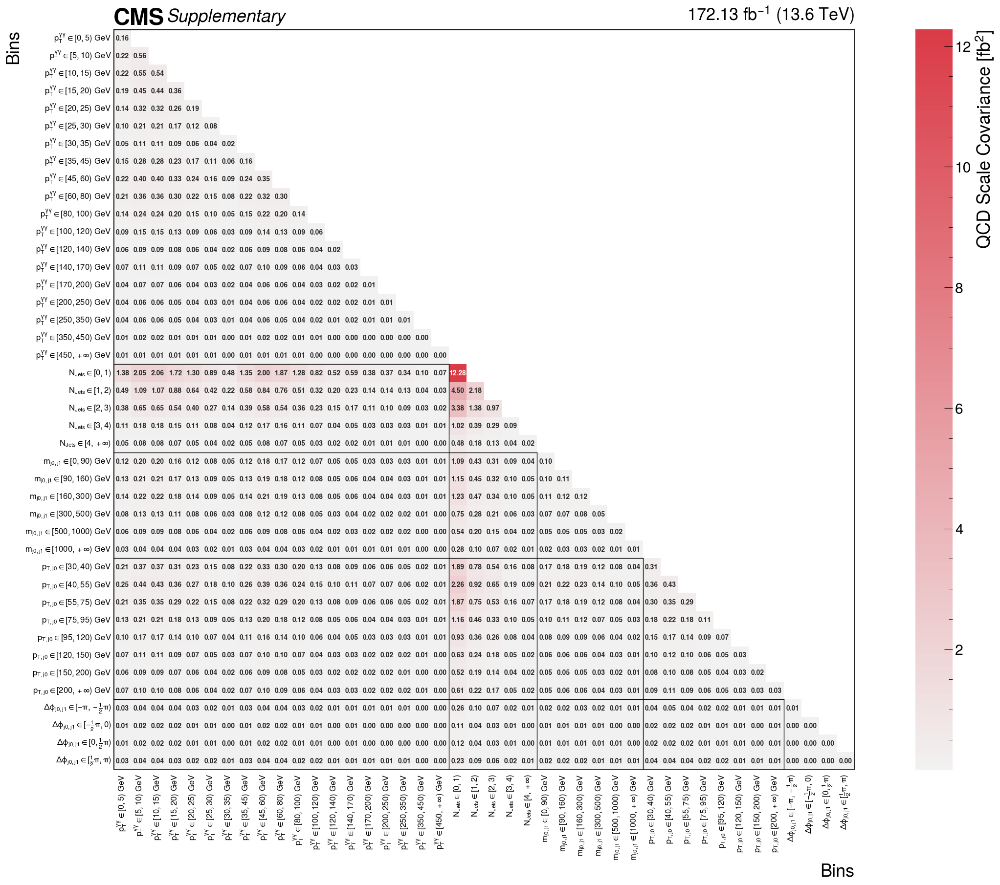

In [1081]:
plot_cov(Cov_scale, title="", save_path="covariance_matrix_scale_klijnsma_combined.pdf", plot_label=r"QCD Scale Covariance [fb$^{2}$]", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-2)

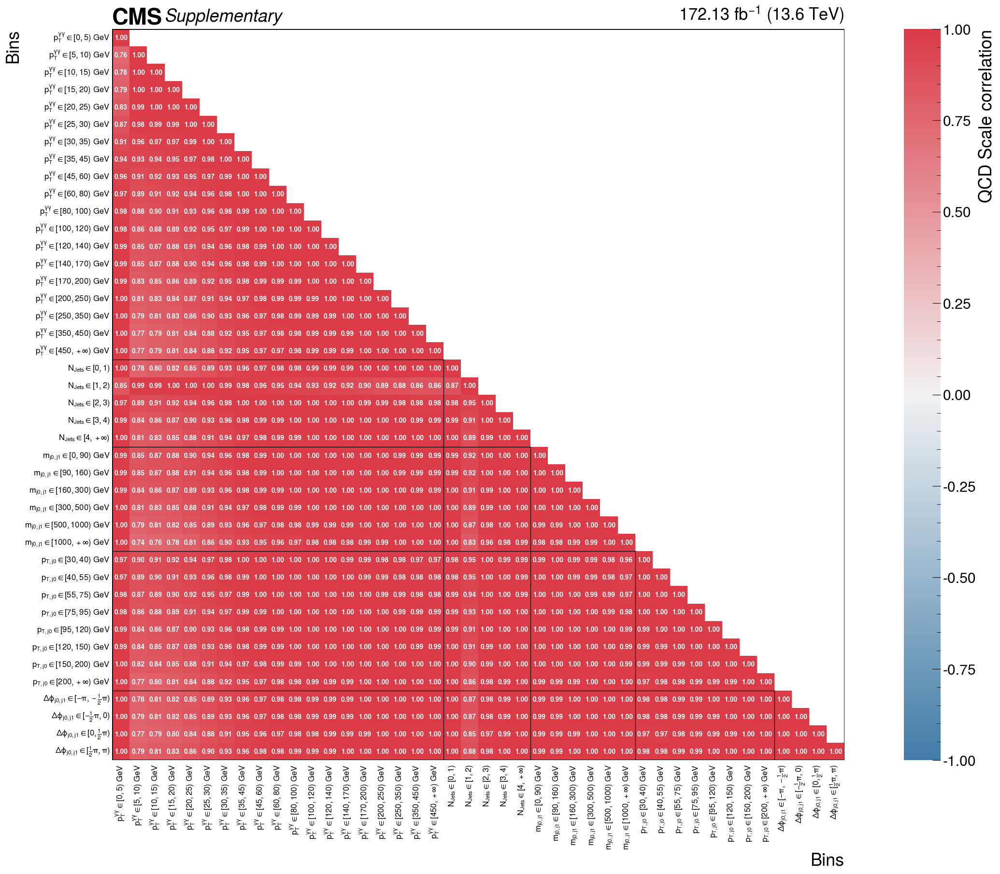

In [1082]:
plot_corr(corr_from_cov(Cov_scale), title="", save_path="correlation_matrix_scale_klijnsma_combined.pdf", plot_label="QCD Scale correlation", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-2)

In [1083]:
Cov_Theor = Cov_pdf + Cov_alpha + Cov_scale

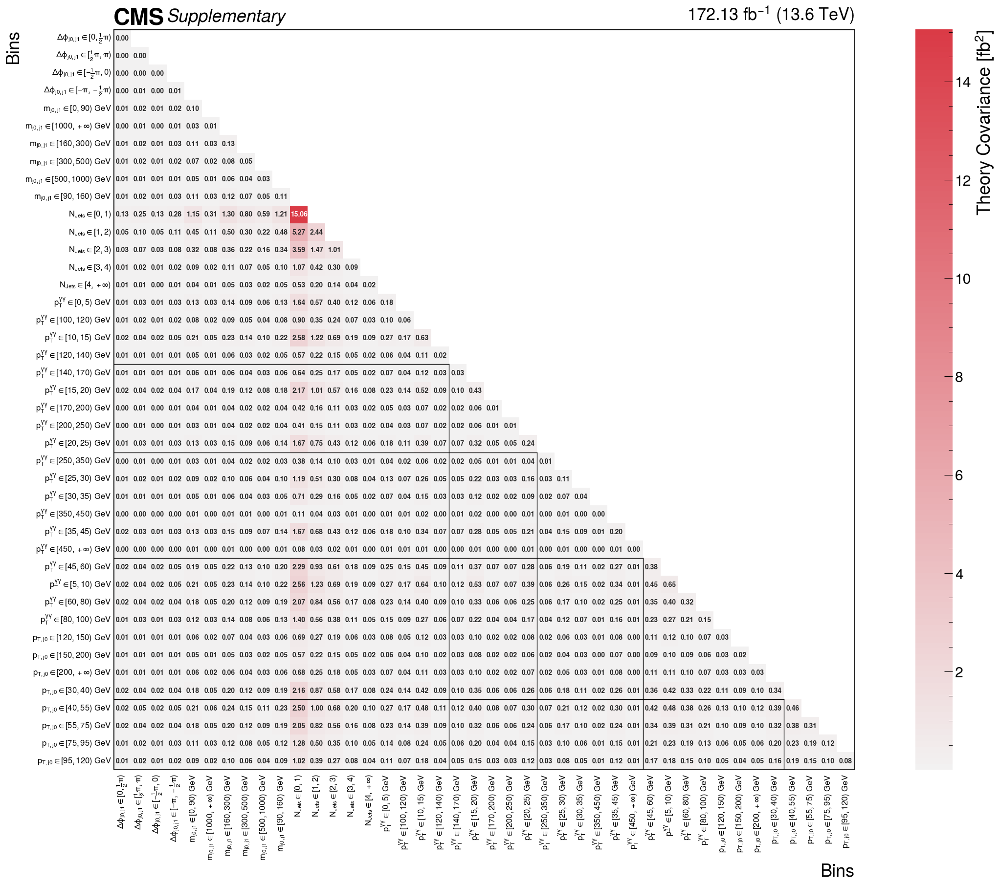

In [1084]:
plot_cov(Cov_Theor, title="", save_path="covariance_matrix_theory_combined.pdf", plot_label=r"Theory Covariance [fb$^{2}$]", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-2)

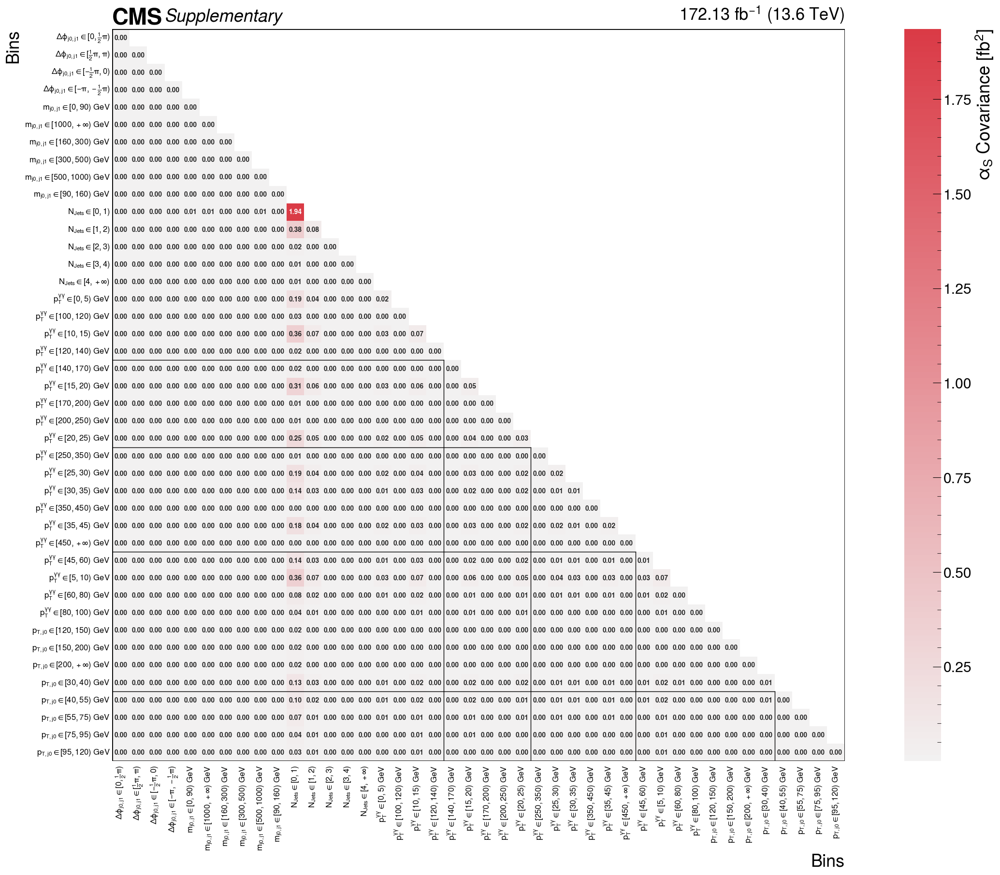

In [1085]:
plot_cov(Cov_alpha, title="", save_path="covariance_matrix_alpha_combined.pdf", plot_label=r"$\alpha_{S}$ Covariance [fb$^{2}$]", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-2)


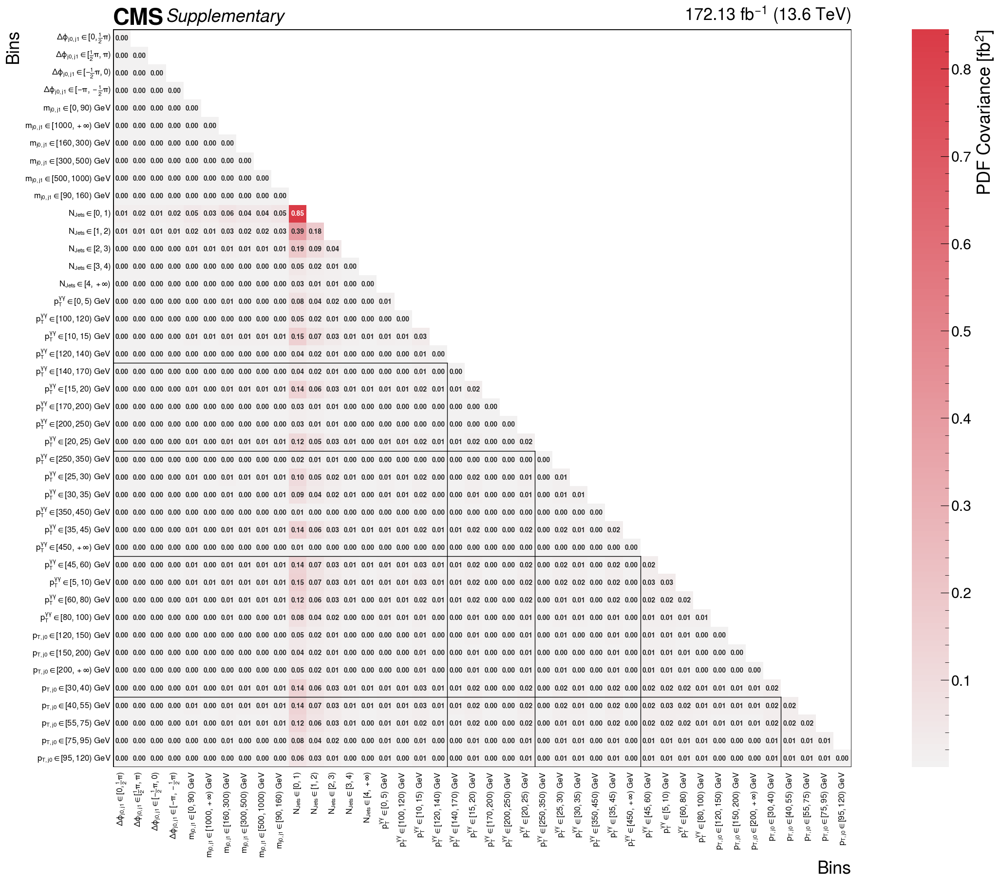

In [1086]:
plot_cov(Cov_pdf, title="", save_path="covariance_matrix_pdf_combined.pdf", plot_label=r"PDF Covariance [fb$^{2}$]", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-2)

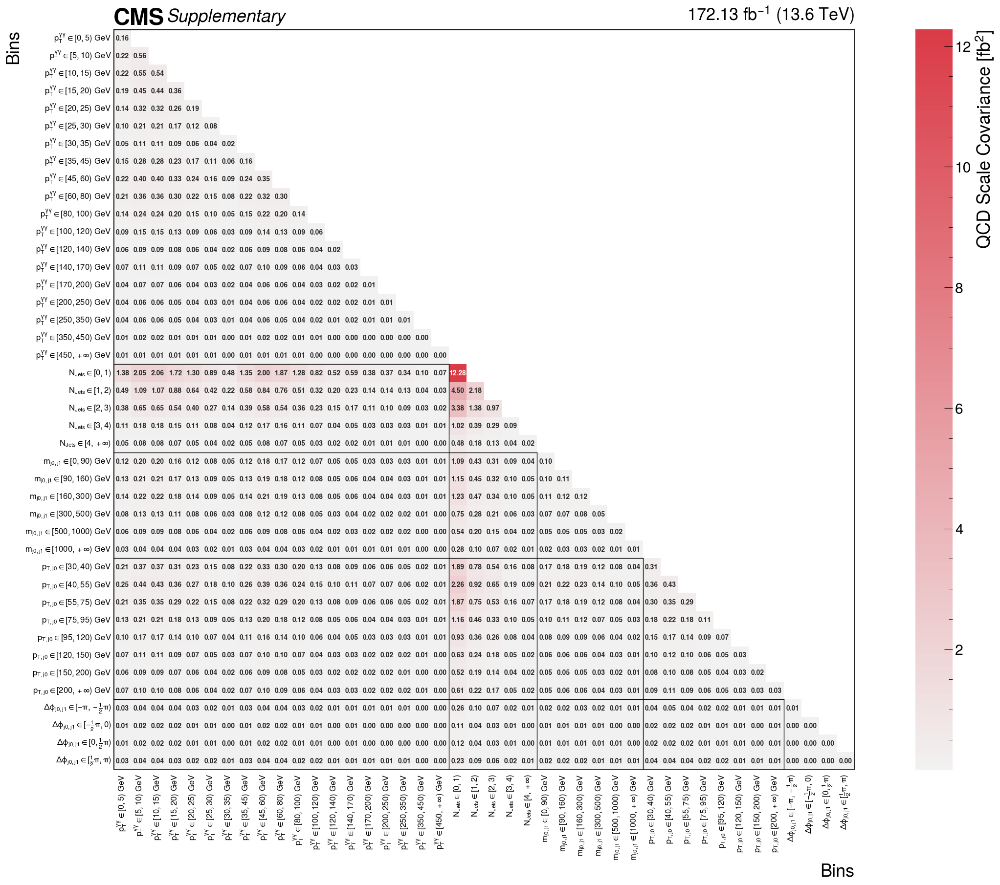

In [1087]:
plot_cov(Cov_scale, title="", save_path="covariance_matrix_scale_combined.pdf", plot_label=r"QCD Scale Covariance [fb$^{2}$]", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-2)

In [1088]:
cov_syst = cov_syst.rename(index=label_map, columns=label_map)
cov_stat = cov_stat.rename(index=label_map, columns=label_map)

# Drop underflow bins
label_maps_noUnderflow = list(label_map.values())
label_maps_noUnderflow.remove("r_PTJ0_m10000p0_30p0")
label_maps_noUnderflow.remove("r_DPhiJ0J1_m3p1416_3p1416_underflow")
label_maps_noUnderflow.remove("r_MassJ0J1_m10000p0_0p0")



cov_syst = cov_syst.loc[label_maps_noUnderflow, label_maps_noUnderflow]
cov_stat = cov_stat.loc[label_maps_noUnderflow, label_maps_noUnderflow]

In [1089]:
cov_tot = cov_stat + cov_syst + Cov_Theor
corr_tot = corr_from_cov(cov_tot)

In [1090]:
cov_tot = cov_tot.rename(index=label_map, columns=label_map)

In [1091]:
corr_tot = corr_tot.loc[label_maps_noUnderflow, label_maps_noUnderflow]
cov_tot = cov_tot.loc[label_maps_noUnderflow, label_maps_noUnderflow]

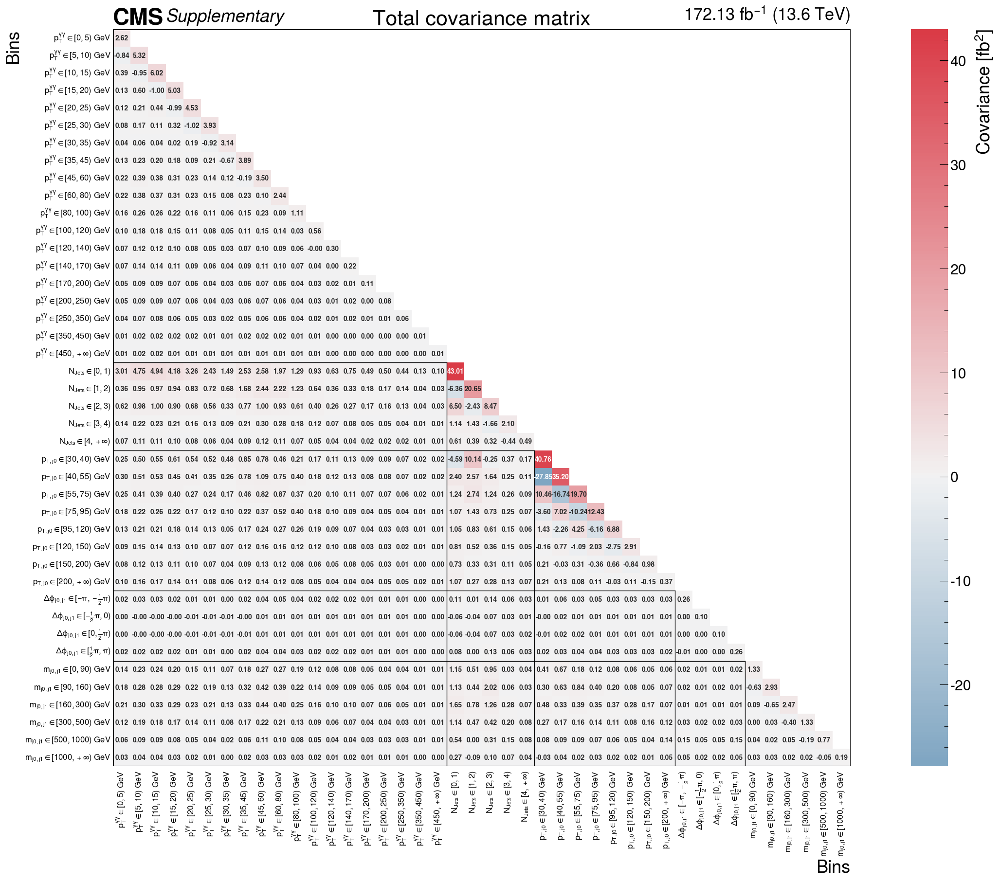

In [1092]:
plot_cov(cov_tot, title="Total covariance matrix", save_path="covariance_matrix_total_combined.pdf", apply_translation=True, label_map=label_map, n_b3=b3, n_b4=b4-4)

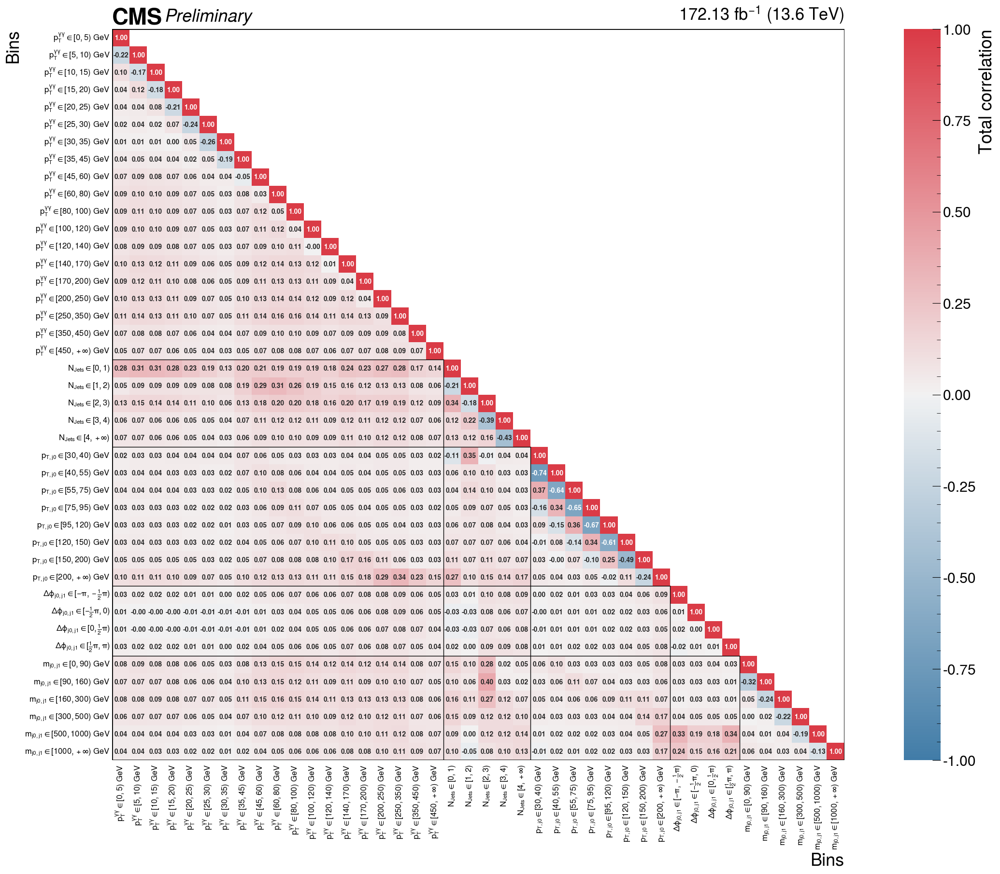

In [1093]:
plot_corr(corr_tot, title="", save_path="correlation_matrix_total_combined.pdf", cms_label="Preliminary", plot_label="Total correlation", apply_translation=True, label_map=label_map, n_b3=b3, n_b4=b4-4)

#### Saving information in Nico-friendly format

In [1094]:
## Save matrices in a Nico-friendly format
import yaml

def dataframe_to_yaml_rows(
    df,
    output_yaml,
    label_map,
    target_order=None,
    zero_tol=0.0,
):
    """
    Convert square DataFrame -> YAML list-of-row-dicts format.

    - df: pandas DataFrame (square)
    - output_yaml: output path
    - label_map: dict old_label -> new_label
    - target_order: list of NEW labels in desired final order.
                    If None, uses DataFrame order after renaming.
    - zero_tol: values with abs(x) < zero_tol are written as 0.0
    """
    if not isinstance(df, pd.DataFrame):
        raise TypeError("df must be a pandas DataFrame")
    if df.shape[0] != df.shape[1]:
        raise ValueError("df must be square")

    # Rename both axes
    m = df.rename(index=label_map, columns=label_map).copy()

    # If desired order not provided, keep current renamed order
    if target_order is None:
        target_order = list(m.index)

    # Validate target labels exist
    missing_rows = [x for x in target_order if x not in m.index]
    missing_cols = [x for x in target_order if x not in m.columns]
    if missing_rows or missing_cols:
        raise KeyError(
            f"Missing labels after renaming.\n"
            f"Rows missing: {missing_rows}\n"
            f"Cols missing: {missing_cols}"
        )

    # Reorder matrix
    m = m.loc[target_order, target_order].astype(float)

    # Build YAML structure: list of dicts (one row per item)
    rows = []
    for _, row in m.iterrows():
        d = {}
        for col, val in row.items():
            x = float(val)
            if abs(x) < zero_tol:
                x = 0.0
            d[col] = x
        rows.append(d)

    with open(output_yaml, "w") as f:
        yaml.safe_dump(rows, f, sort_keys=False, default_flow_style=False)

def extract_diag_sqrt(Cov_Theor):
    """
    Extract the diagonal elements of a pandas DataFrame
    and return their square roots in a dictionary.

    Parameters
    ----------
    Cov_Theor : pandas.DataFrame
        Square covariance matrix.

    Returns
    -------
    dict
        Dictionary with column/index names as keys and
        sqrt(diagonal element) as values.
    """
    diag_values = np.diag(Cov_Theor.values)
    
    return {
        name: np.sqrt(value)
        for name, value in zip(Cov_Theor.index, diag_values)
    }

In [1095]:
target_order = pois["PTH"] + pois["NJ"] + pois["PTJ0"] + pois["DPhiJ0J1"] + pois["MassJ0J1"]# + pois["YH"]

In [1096]:
target_order.remove("r_PTJ0_m10000p0_30p0")
target_order.remove("r_DPhiJ0J1_m3p1416_3p1416_underflow")
target_order.remove("r_MassJ0J1_m10000p0_0p0")

In [1097]:
dataframe_to_yaml_rows(
    df=corr_tot, 
    output_yaml="PTH_NJ_PTJ0_DPhiJ0J1_MassJ0J1.yaml",
    label_map=label_map,
    target_order=target_order,
    zero_tol=1e-12, ## zero_tol is the threshold below which numbers are forced to 0.0 when exporting
)

In [1098]:
dataframe_to_yaml_rows(
    df=Cov_Theor, 
    output_yaml="cov_theory.yaml",
    label_map=label_map,
    target_order=target_order,
    zero_tol=1e-12, ## zero_tol is the threshold below which numbers are forced to 0.0 when exporting
)

In [1099]:
extract_diag_sqrt(Cov_Theor)

{'r_DPhiJ0J1_0p0_1p5708': 0.03654020812180326,
 'r_DPhiJ0J1_1p5708_3p1416': 0.06964324539630755,
 'r_DPhiJ0J1_m1p5708_0p0': 0.03460833846502575,
 'r_DPhiJ0J1_m3p1416_m1p5708': 0.07759441100548264,
 'r_MassJ0J1_0p0_90p0': 0.3170653855488849,
 'r_MassJ0J1_1000p0_10000p0': 0.08486199953182925,
 'r_MassJ0J1_160p0_300p0': 0.35927269839911274,
 'r_MassJ0J1_300p0_500p0': 0.22033516492548516,
 'r_MassJ0J1_500p0_1000p0': 0.16073346871918723,
 'r_MassJ0J1_90p0_160p0': 0.33662492193793003,
 'r_NJ_0p0_1p0': 3.880860726008241,
 'r_NJ_1p0_2p0': 1.5607224370099548,
 'r_NJ_2p0_3p0': 1.004850073972498,
 'r_NJ_3p0_4p0': 0.29735331303645357,
 'r_NJ_4p0_100p0': 0.14261595161697135,
 'r_PTH_0p0_5p0': 0.42438122881815304,
 'r_PTH_100p0_120p0': 0.24376637409975047,
 'r_PTH_10p0_15p0': 0.7946793751829242,
 'r_PTH_120p0_140p0': 0.15533203894447667,
 'r_PTH_140p0_170p0': 0.17485510724175593,
 'r_PTH_15p0_20p0': 0.6572023636197347,
 'r_PTH_170p0_200p0': 0.11225189430789168,
 'r_PTH_200p0_250p0': 0.10989812910205

In [1100]:
# For PCA

dataframe_to_yaml_rows(
    df=cov_tot, 
    output_yaml="cov_tot_PTH_NJ_PTJ0_DPhiJ0J1_MassJ0J1.yaml",
    label_map=label_map,
    target_order=target_order,
    zero_tol=1e-12, ## zero_tol is the threshold below which numbers are forced to 0.0 when exporting
)

In [438]:
fidXS_PTH = [3.251514094855517, 6.413825763609831, 6.555809968521467, 5.889800810939074, 5.099083112515962, 4.421885114513488, 3.866226543790849, 6.441680337807897, 6.902988952146682, 5.9025422289283505, 3.8146832368240626, 2.5035992765212907, 1.728313772250199, 1.7476552427460155, 1.0831025476943583, 1.0182794676925542, 0.8199434493201138, 0.25644320024731754, 0.16456440773573974]
fidXS_NJ = [36.46013279924294, 19.39595337442149, 8.780897688557815, 2.1285339711776765, 1.117648241828872]
fidXS_PTJ0 = [36.46013279924294, 6.663873021305533, 7.050146523728949, 5.894645706317997, 3.654783295750552, 2.8293975792219843, 1.990389506704825, 1.6537018867095121, 38.14622855548648]
fidXS_YH = [6.571010820445315, 6.4878499407752805, 6.374530083157725, 6.159720064093899, 5.79610179997262, 5.471530119936904, 9.913956621106973, 10.81253639411838, 7.0842765398757725, 3.211653691747486]
fidXS_DPhiJ0J1 = [65.21952099254116, 0.8106934454948248, 0.5284340993292949, 0.5398399759381666, 0.7845488948952335]


uncMu_total_PTH = [0.481, 0.339, 0.355, 0.365, 0.410, 0.446, 0.457, 0.300, 0.258, 0.249, 0.260, 0.284, 0.305, 0.251, 0.287, 0.259, 0.259, 0.429, 0.582]
uncMu_stat_PTH = [0.480, 0.337, 0.354, 0.364, 0.406, 0.442, 0.455, 0.298, 0.256, 0.247, 0.258, 0.283, 0.304, 0.250, 0.285, 0.258, 0.258, 0.427, 0.580]
uncMu_syst_PTH = [np.sqrt(uncMu_total_PTH[i]**2 - uncMu_stat_PTH[i]**2) for i, _ in enumerate(uncMu_total_PTH)]

uncMu_total_NJ = [0.150, 0.223, 0.315, 0.672, 0.619]
uncMu_stat_NJ = [0.145, 0.220, 0.311, 0.665, 0.614]
uncMu_syst_NJ = [np.sqrt(uncMu_total_NJ[i]**2 - uncMu_stat_NJ[i]**2) for i, _ in enumerate(uncMu_total_NJ)]

uncMu_total_PTJ0 = [0.163, 0.958, 0.841, 0.751, 0.964, 0.927, 0.854, 0.594, 0.349]
uncMu_stat_PTJ0 = [0.155, 0.954, 0.836, 0.747, 0.960, 0.922, 0.851, 0.591, 0.346]
uncMu_syst_PTJ0 = [np.sqrt(uncMu_total_PTJ0[i]**2 - uncMu_stat_PTJ0[i]**2) for i, _ in enumerate(uncMu_total_PTJ0)]

uncMu_total_YH = [0.193, 0.203, 0.227, 0.229, 0.254, 0.277, 0.237, 0.306, 0.414, 0.694]
uncMu_stat_YH = [0.190, 0.203, 0.225, 0.226, 0.252, 0.275, 0.234, 0.306, 0.414, 0.692]
uncMu_syst_YH = [np.sqrt(uncMu_total_YH[i]**2 - uncMu_stat_YH[i]**2) for i, _ in enumerate(uncMu_total_YH)]

uncMu_total_DPhiJ0J1 = [0.088, 0.616, 0.571, 0.566, 0.646]
uncMu_stat_DPhiJ0J1 = [0.083, 0.610, 0.563, 0.557, 0.640]
uncMu_syst_DPhiJ0J1 = [np.sqrt(uncMu_total_DPhiJ0J1[i]**2 - uncMu_stat_DPhiJ0J1[i]**2) for i, _ in enumerate(uncMu_total_DPhiJ0J1)]



uncMu_stat = uncMu_stat_PTH + uncMu_stat_NJ + uncMu_stat_PTJ0 + uncMu_stat_DPhiJ0J1# + uncMu_stat_YH
uncMu_syst = uncMu_syst_PTH + uncMu_syst_NJ + uncMu_syst_PTJ0 + uncMu_syst_DPhiJ0J1# + uncMu_syst_YH


covMu_stat = cor_cholesky * np.outer(uncMu_stat, uncMu_stat)
covMu_syst = syst_matrix * np.outer(uncMu_syst, uncMu_syst)

covMu_stat = covMu_stat.rename(index=label_map, columns=label_map)
covMu_syst = covMu_syst.rename(index=label_map, columns=label_map)

In [439]:
fidXS = fidXS_PTH + fidXS_NJ + fidXS_PTJ0 + fidXS_DPhiJ0J1# + fidXS_YH

In [440]:
sqrt_diag = np.sqrt(np.diag(Cov_Theor))

In [441]:
uncMu_theor = [unc_theor / fidXS[i] for i, unc_theor in enumerate(sqrt_diag)]

In [442]:
CovMu_Theor = corr_from_cov(Cov_Theor) * np.outer(uncMu_theor,uncMu_theor)

In [443]:
CovMu_tot = covMu_stat + covMu_syst# + CovMu_Theor 

In [444]:
CovMu_tot = CovMu_tot.rename(index=label_map, columns=label_map)
CovMu_tot = CovMu_tot.loc[list(label_map.values()), list(label_map.values())]

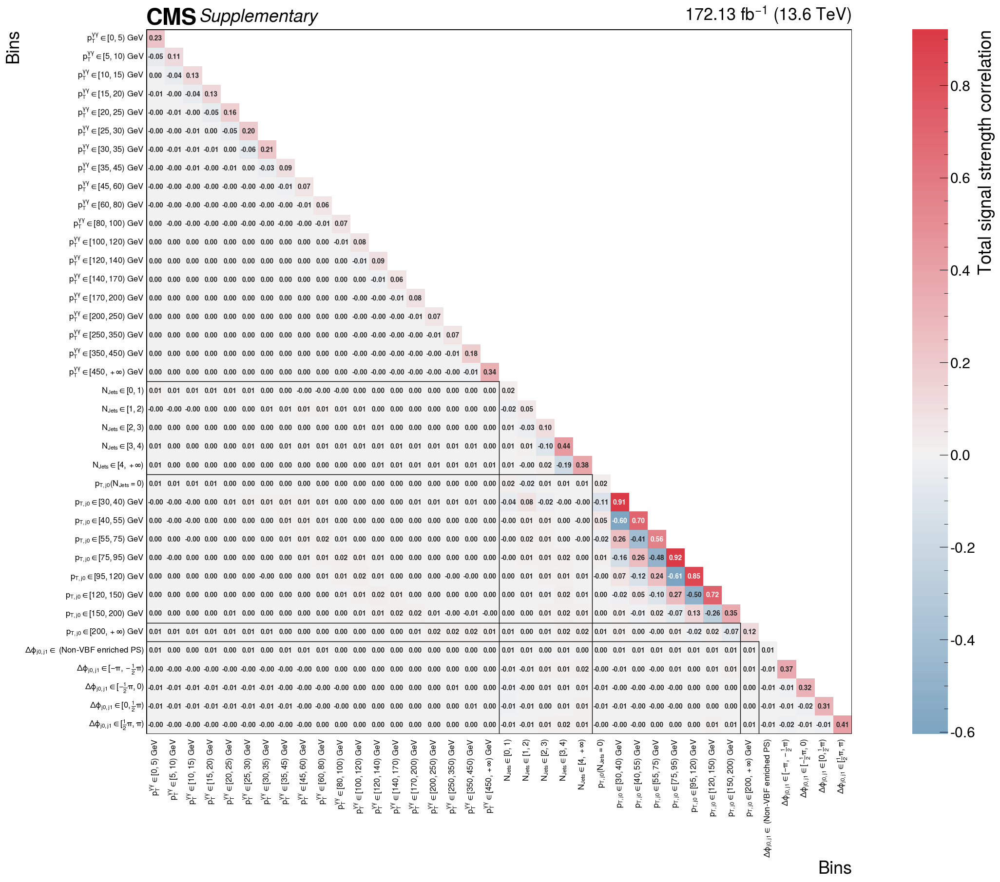

In [445]:
plot_cov(CovMu_tot, title=r"", save_path="covariance_matrix_total_mu_combined.pdf", plot_label="Total signal strength correlation", apply_translation=True, label_map=label_map, n_b3=b3-2)

In [446]:
dataframe_to_yaml_rows(
    df=CovMu_tot, 
    output_yaml="cov_tot_PTH_NJ_PTJ0_DPhiJ0J1_mu_noTHU.yaml",
    label_map=label_map,
    target_order=target_order,
    zero_tol=1e-12, ## zero_tol is the threshold below which numbers are forced to 0.0 when exporting
)